In [2]:
printmd('Retail Analysis with WalMart Data') 

printmd('Deep Neural Network Regression Model for Store 45 with R squared value of .91') 

printmd('45 Linear Regression Models for 45 WalMart stores')
printmd('Several other Regression Models for Store 1 including Decision Tree, Random Forest, Lasso, Ridge, ElasticNet etc.')

printmd('Weekly, Monthly and Semester sales analysis for all 45 stores')

## <span style="color:#1111cc">Retail Analysis with WalMart Data</span>

## <span style="color:#1111cc">Deep Neural Network Regression Model for Store 45 with R squared value of .91</span>

## <span style="color:#1111cc">45 Linear Regression Models for 45 WalMart stores</span>

## <span style="color:#1111cc">Several other Regression Models for Store 1 including Decision Tree, Random Forest, Lasso, Ridge, ElasticNet etc.</span>

## <span style="color:#1111cc">Weekly, Monthly and Semester sales analysis for all 45 stores</span>

In [3]:
#######################################################################################################
# Import the Pandas and other libraries 
#######################################################################################################
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown('## <span style="color:#1111cc">'+string+'</span>'))

In [4]:
#######################################################################################################
# load the Walmart store sales csv file
#######################################################################################################
WData = pd.read_csv('./datasets/Walmart_Store_sales.csv')

In [5]:
#######################################################################################################
# check the number/type of variables, number of rows and null value presence
#######################################################################################################
WData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [6]:
printmd('No null values as we see from the above information')

## <span style="color:#1111cc">No null values as we see from the above information</span>

In [7]:
#######################################################################################################
# check the statistics such as mean, std of the numerical variables
#######################################################################################################
WData.describe()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [8]:
#######################################################################################################
# look at the first five records of the file
#######################################################################################################
WData.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [9]:
#######################################################################################################
# look at the correlation between different variables
#######################################################################################################
WData.corr()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Weekly_Sales,-3.353320e-01,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


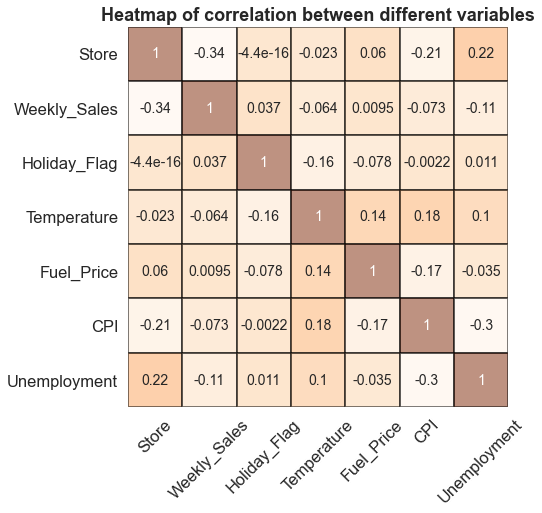

In [10]:
#######################################################################################################
# plot the graph of correlation between different variables using seaborn heatmap
#######################################################################################################

sns.set(style='whitegrid', palette='muted', font_scale=1.5)
%matplotlib inline
plt.figure(figsize=(7,7))
sns.heatmap(WData.corr(),linewidths=2,linecolor='black',square=True,cbar=False,alpha=.5,
            annot=True,robust=True,annot_kws={'fontsize':14}, fmt=".2g",cmap=plt.cm.Oranges)
plt.title('Heatmap of correlation between different variables',fontsize=18,fontweight='bold')
plt.xticks(rotation=45)
plt.show()

<Figure size 432x144 with 0 Axes>

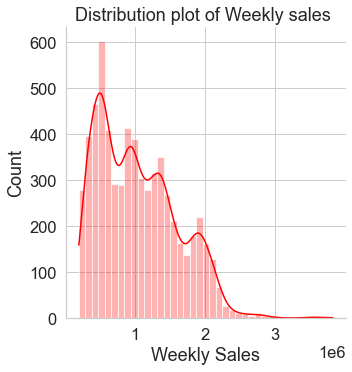

In [11]:
#######################################################################################################
# plot the displot graph of the weekly sales 
#######################################################################################################
plt.figure(figsize=(6,2))
sns.displot(WData['Weekly_Sales'],color='red',alpha=.3,kde=True)
plt.title('Distribution plot of Weekly sales ')
plt.xlabel('Weekly Sales')
plt.show()

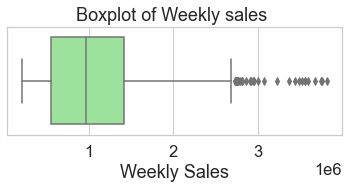

In [12]:
#######################################################################################################
# plot the boxplot of weekly sales to see consistancy
#######################################################################################################
plt.figure(figsize=(6,2))
sns.boxplot(x=WData['Weekly_Sales'],color='lightgreen')
plt.title('Boxplot of Weekly sales ')
plt.xlabel('Weekly Sales')
plt.show()

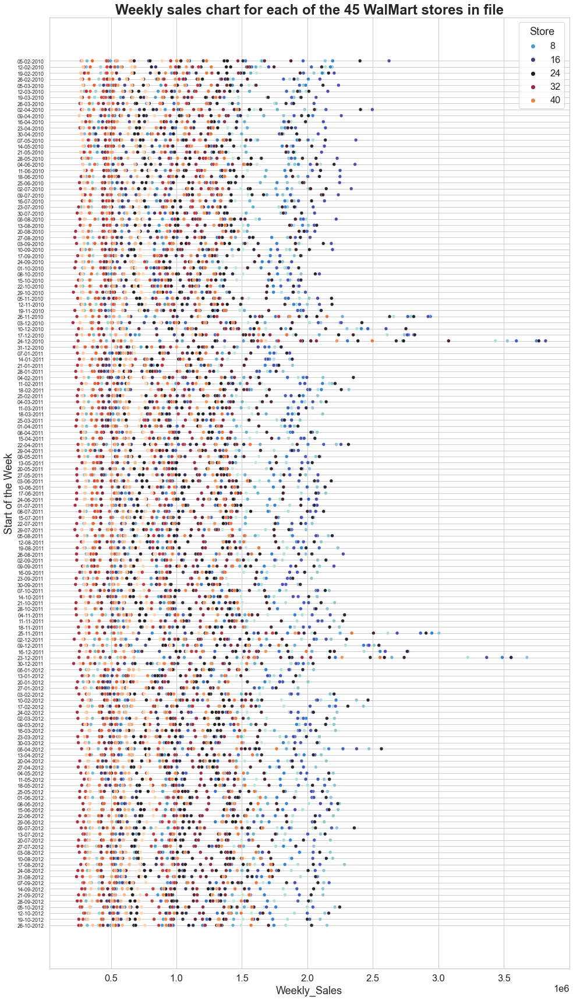

In [13]:
#######################################################################################################
# plot the weekly sales graph of all 45 stores for all weeks 
#######################################################################################################
plt.figure(figsize=(16,30))
sns.scatterplot(data=WData,x=WData['Weekly_Sales'],y=WData['Date'],hue=WData['Store'],palette='icefire')
plt.title('Weekly sales chart for each of the 45 WalMart stores in file',fontsize=24,fontweight='bold')
plt.ylabel('Start of the Week')
plt.yticks(fontsize=9)
plt.show()

In [14]:
#######################################################################################################
# format the date variable and write code to create new variable with holiday events such as
# super bowl, labor day, Thanksgiving day, chirstmas day
#######################################################################################################
from datetime import date

WData.loc[:,'Date'] = pd.to_datetime(WData['Date'])

SB_dates = pd.DataFrame({'Date':('12-Feb-10', '11-Feb-11', '10-Feb-12', '8-Feb-13')})
LD_dates = pd.DataFrame({'Date':('10-Sep-10', '9-Sep-11', '7-Sep-12', '6-Sep-13')})
TG_dates = pd.DataFrame({'Date':('26-Nov-10', '25-Nov-11', '23-Nov-12', '29-Nov-13')})
CM_dates = pd.DataFrame({'Date':('31-Dec-10', '30-Dec-11', '28-Dec-12', '27-Dec-13')})

SB_dates.loc[:,'Date'] = pd.to_datetime(SB_dates['Date'])
LD_dates.loc[:,'Date'] = pd.to_datetime(LD_dates['Date'])
TG_dates.loc[:,'Date'] = pd.to_datetime(TG_dates['Date'])
CM_dates.loc[:,'Date'] = pd.to_datetime(CM_dates['Date'])

In [15]:
#######################################################################################################
# write a fuction to extract code vale for holiday events such as 1 for super bowl, 2 for labor day,
# 3 for thanks giving day and 4 for chirstmas day
#######################################################################################################
def  label_holiday(row) :   
    
    if row.Date in list(SB_dates['Date']):
        return 1
    elif row.Date in list(LD_dates['Date']):
        return 2
    elif row.Date in list(TG_dates['Date']):
        return 3
    elif row.Date in list(CM_dates['Date']):
        return 4
    else:
        return 0
    

In [16]:
#######################################################################################################
# create a new variable with codes for holiday events
#######################################################################################################
WData['Holiday_Events'] =  WData.apply(lambda row: label_holiday(row), axis=1)
    

In [17]:
#######################################################################################################
# look at the first five records after creating the hoiliday events variable
#######################################################################################################
WData.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Holiday_Events
0,1,2010-05-02,1643690.90,0,42.31,2.572,211.096358,8.106,0
1,1,2010-12-02,1641957.44,1,38.51,2.548,211.242170,8.106,0
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,0
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,0
4,1,2010-05-03,1554806.68,0,46.50,2.625,211.350143,8.106,0


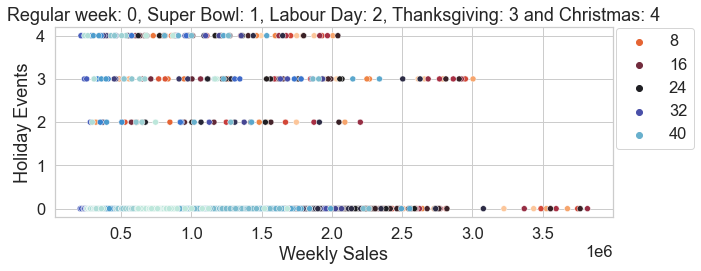

In [18]:
#######################################################################################################
# plot the scatterplot graph with holiday events and weekly sales for all 45 stores 
#######################################################################################################
plt.figure(figsize=(10,3.5))
sns.scatterplot(data=WData,x=WData['Weekly_Sales'],y=WData['Holiday_Events'],hue=WData['Store'],palette='icefire_r')
plt.title('Regular week: 0, Super Bowl: 1, Labour Day: 2, Thanksgiving: 3 and Christmas: 4')
plt.legend(bbox_to_anchor=(0.66, 0.54, 0.5, 0.5))
plt.xlabel('Weekly Sales')
plt.ylabel('Holiday Events')
plt.show()

###### Holoiday_Events:
----------------------
Regular week:  0  
Super Bowl:    1
Labour Day:    2
Thanksgiving:  3
Christmas:     4

In [19]:
#######################################################################################################
# accumulate the weekly sales for all 45 stores from jan 2010 thru dec 2012 
#######################################################################################################
groupsSALES = WData.iloc[:,0:3].groupby(by='Store').sum()


In [20]:
#######################################################################################################
# extract the Store with maximum sales during the above said period
#######################################################################################################
argmaxsales = groupsSALES.Weekly_Sales.argmax()
print((groupsSALES.iloc[argmaxsales]))

Weekly_Sales    3.013978e+08
Name: 20, dtype: float64


In [21]:
#######################################################################################################
# sort the total sales for all stores to view the top 5 stores with highest sales
#######################################################################################################
groupsSALES.rename(columns={'Weekly_Sales':'Total Sales from Jan 2010 thru Dec 2012'},inplace=True)
groupsSALES.sort_values(by='Total Sales from Jan 2010 thru Dec 2012',ascending=False).head()

,Total Sales from Jan 2010 thru Dec 2012
Store,
20,3.013978e+08
4,2.995440e+08
14,2.889999e+08
13,2.865177e+08
2,2.753824e+08


In [22]:
printmd('As we see above and below store 20 has the maximum total sales, followed by stores 4,14,13..')

## <span style="color:#1111cc">As we see above and below store 20 has the maximum total sales, followed by stores 4,14,13..</span>

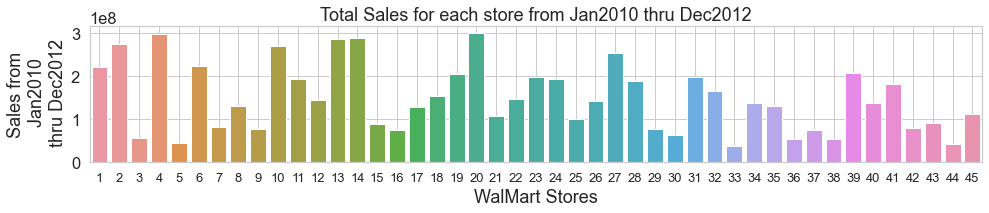

In [23]:
#######################################################################################################
# plot the graph of total sales for each store from jan 2010 thru dec 2012 
#######################################################################################################
plt.figure(figsize=(16,2.5))
sns.barplot(data=groupsSALES,y=groupsSALES['Total Sales from Jan 2010 thru Dec 2012'], \
            hue_order=groupsSALES.index,x=groupsSALES.index) 
plt.title('Total Sales for each store from Jan2010 thru Dec2012')
plt.ylabel('Sales from\n Jan2010\n thru Dec2012')
plt.grid(True)
plt.xlabel('WalMart Stores')
plt.xticks(fontsize=13)
plt.show()

In [24]:
#######################################################################################################
# calculate the standard deviation in sales for the above said period for all 45 stores
#######################################################################################################
groupsSTD = WData.iloc[:,0:3].groupby(by='Store').std()

groupsSTD.rename(columns={'Weekly_Sales':'Standard Deviation'},inplace=True)
groupsSTD.sort_values(by='Standard Deviation',ascending=False).iloc[0:5,0:2]

,Standard Deviation
Store,
14,317569.949476
10,302262.062504
20,275900.562742
4,266201.442297
13,265506.995776


In [25]:
printmd('As we see above and below store 14 has the highest STD, followed by stores 10,20,4...')

## <span style="color:#1111cc">As we see above and below store 14 has the highest STD, followed by stores 10,20,4...</span>

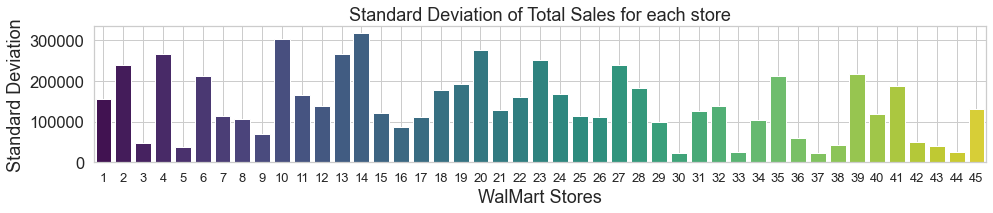

In [26]:
#######################################################################################################
# plot  the graph of standard deviation of sales for all 45 stores
#######################################################################################################

plt.figure(figsize=(16,2.5))
sns.barplot(data=groupsSTD,y=groupsSTD['Standard Deviation'],hue_order=range(1,90,2),x=groupsSTD.index,palette='viridis') 
plt.title('Standard Deviation of Total Sales for each store')
plt.xticks(fontsize=13)
plt.grid(True)
plt.xlabel('WalMart Stores')
plt.show()

In [27]:
#######################################################################################################
# Store the standard deviation values alone in that variable and remove the weekly sales to use later
#######################################################################################################
groupsSTD = groupsSTD.iloc[0:,0:]
groupsSTD.head()

,Standard Deviation
Store,
1,155980.767761
2,237683.694682
3,46319.631557
4,266201.442297
5,37737.965745


In [28]:
#######################################################################################################
# calculate the mean/average of sales for all stores from Jan 2010 thru Dec 2012
#######################################################################################################
groupsMean = WData.iloc[:,0:3].groupby(by='Store').mean()
groupsMean.rename(columns={'Weekly_Sales':'Mean_Sales'},inplace=True)
groupsMean.head()

,Mean_Sales
Store,
1,1.555264e+06
2,1.925751e+06
3,4.027044e+05
4,2.094713e+06
5,3.180118e+05


In [29]:
#######################################################################################################
# calculate the coefficient of variance for all stores from Jan 2010 thru Dec 2012
#######################################################################################################
groupsCV = pd.concat((groupsSTD,groupsMean),axis=1)
groupsCV['CV'] =  groupsCV.iloc[:,0]/groupsCV.iloc[:,1] * 100
groupsCV.sort_values(by='CV',ascending=False).head()

,Standard Deviation,Mean_Sales,CV
Store,,,
35,211243.457791,9.197250e+05,22.968111
7,112585.469220,5.706173e+05,19.730469
15,120538.652043,6.233125e+05,19.338399
29,99120.136596,5.394514e+05,18.374247
23,249788.038068,1.389864e+06,17.972115


In [30]:
printmd('As we see store 35 has the highest Coeff. of mean to STD')

## <span style="color:#1111cc">As we see store 35 has the highest Coeff. of mean to STD</span>

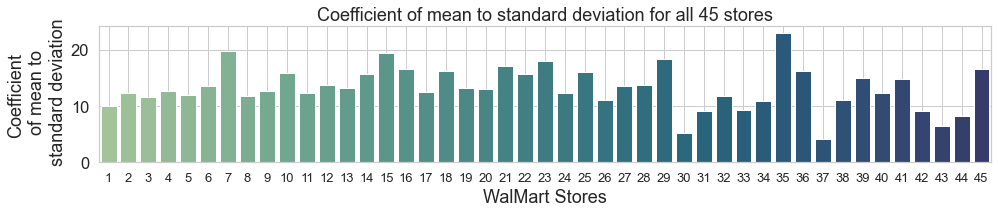

In [31]:
#######################################################################################################
# plot the graph of coefficient of variance for all 45 stores from Jan 2010 thru Dec 2012 
#######################################################################################################
groupsCV['Coefficient of mean to standard deviation'] = groupsCV['CV']
plt.figure(figsize=(16,2.5))
sns.barplot(data=groupsCV,y=groupsCV['Coefficient of mean to standard deviation'],x=groupsCV.index,palette='crest') 
plt.title('Coefficient of mean to standard deviation for all 45 stores')
plt.ylabel('Coefficient\n of mean to\n standard deviation')
plt.xticks(fontsize=13)
plt.xlabel('WalMart Stores')
plt.grid(True)
plt.show()

In [32]:
#######################################################################################################
# backup the walmart data to use later
#######################################################################################################
WData_bkp = WData

In [33]:
#######################################################################################################
# extract data for all 45 stores to calculate growth in Q3 2012 
#######################################################################################################
WData = WData[(WData['Date'] >= '2012-07-01 00:00:00') ]
WData = WData[(WData['Date'] <= '2012-09-30 00:00:00') ]

WData = WData.iloc[ : , 0:3]
WData.count()

Store           540
Date            540
Weekly_Sales    540
dtype: int64

In [34]:
#######################################################################################################
# code to calculate growth for all 45 stores and view the top 5 stores with maximum growth
#######################################################################################################
WDataSort = WData.sort_values(by=['Store','Date'])
Walmart_Growth = pd.DataFrame({'Store':(range(0,45)),'Min':(range(0,45)),'Max':(range(0,45)),\
                               'Growth%':(range(0,45))})
import warnings
warnings.filterwarnings('ignore')
i = 0
j = 0

for x in range(0,540):
    if i == 0:
        Walmart_Growth['Store'].iloc[j] = WDataSort['Store'].iat[x]
        Walmart_Growth['Min'].iloc[j] = WDataSort['Weekly_Sales'].iat[x] 
    if i == 11:
        Walmart_Growth['Max'].iloc[j] = WDataSort['Weekly_Sales'].iat[x]
        Walmart_Growth['Growth%'].iloc[j] = ((Walmart_Growth['Max'].iloc[j]-Walmart_Growth['Min'].iloc[j])
                                             /Walmart_Growth['Min'].iloc[j])*100
    i = i + 1
    if i == 12:
        j = j + 1
        i = 0
    
    
Walmart_Growth.sort_values(by='Growth%',ascending=False).head()

,Store,Min,Max,Growth%
43,44,338737.33,355307.94,4.891876
31,32,1126685.95,1157111.15,2.700415
24,25,671482.90,683300.84,1.759976
20,21,642827.29,647097.65,0.664309
36,37,526838.14,527953.14,0.211640


In [35]:
printmd('As we see store 44 has the highest growth rate in Q3-2012')
printmd('Only five stores have positive growth during that quarter')

## <span style="color:#1111cc">As we see store 44 has the highest growth rate in Q3-2012</span>

## <span style="color:#1111cc">Only five stores have positive growth during that quarter</span>

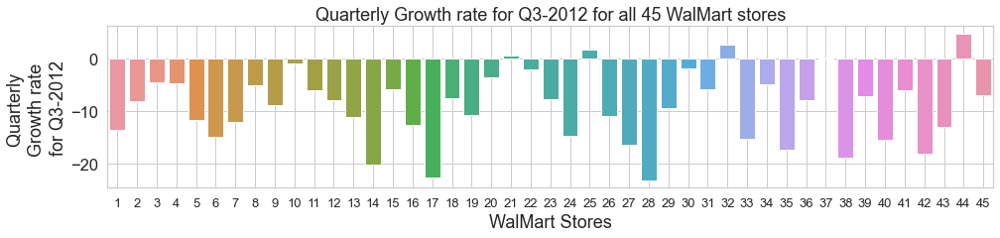

In [36]:
#######################################################################################################
# plot the graph of growth for all 45 stores 
#######################################################################################################
Walmart_Growth['Quarterly Growth rate for Q3-2012'] = Walmart_Growth['Growth%']
growth = pd.DataFrame()
growth['importance'] = Walmart_Growth['Quarterly Growth rate for Q3-2012']
growth['positive'] = growth['importance']>0
plt.figure(figsize=(16,3))
sns.barplot(data=Walmart_Growth,y=Walmart_Growth['Quarterly Growth rate for Q3-2012'], \
             x=Walmart_Growth.Store) 
plt.ylabel('Quarterly \nGrowth rate \nfor Q3-2012')
plt.title('Quarterly Growth rate for Q3-2012 for all 45 WalMart stores')
plt.xticks(fontsize=13)
plt.xlabel('WalMart Stores')
plt.grid(True)
plt.show()

In [37]:
#######################################################################################################
# seperate the data with and without holiday flag to see the impact of holidays
#######################################################################################################
WData = WData_bkp 
WData_Holiday = WData[WData['Holiday_Flag']==1]
WData_Regular = WData[WData['Holiday_Flag']==0]

In [38]:
#######################################################################################################
# calculate the mean of sales for non-holiday(regular) days to compare with sales with holiday sales
#######################################################################################################
WData_Holiday = WData_Holiday.iloc[:,0:3]
WData_RegMean = WData_Regular.iloc[:,2:3].mean()
WData_Holiday.shape, WData_RegMean.shape

((450, 3), (1,))

In [39]:
#######################################################################################################
# view the mean value of sales for non-holiday(regular days) sales
#######################################################################################################
WData_RegMean.iloc[0:1]

Weekly_Sales    1.041256e+06
dtype: float64

In [40]:
#######################################################################################################
# view the holiday sales for store 1 for all 3 years
#######################################################################################################
WData_Holiday.iloc[0:10,0:3]

,Store,Date,Weekly_Sales
1,1,2010-12-02,1641957.44
31,1,2010-10-09,1507460.69
42,1,2010-11-26,1955624.11
47,1,2010-12-31,1367320.01
53,1,2011-11-02,1649614.93
83,1,2011-09-09,1540471.24
94,1,2011-11-25,2033320.66
99,1,2011-12-30,1497462.72
105,1,2012-10-02,1802477.43
135,1,2012-07-09,1661767.33


In [41]:
#######################################################################################################
# Define a function to calculate the difference between holiday and mean regular days sales
#######################################################################################################
def holiday_minus_regular_sales(row, RegMeanSales):
    return (row.Weekly_Sales - RegMeanSales)


Rsales = WData_RegMean.iloc[0:1]
        
WData_Holiday['Holiday_Minus_Regular_Week_sales']=WData_Holiday.apply(lambda row: holiday_minus_regular_sales(row,Rsales),axis=1)
    
WData_Holiday.sort_values(by='Holiday_Minus_Regular_Week_sales',ascending=False).iloc[0:10,0:5]

,Store,Date,Weekly_Sales,Holiday_Minus_Regular_Week_sales
523,4,2011-11-25,3004702.33,1.963446e+06
1381,10,2011-11-25,2950198.64,1.908942e+06
1329,10,2010-11-26,2939946.38,1.898690e+06
1901,14,2010-11-26,2921709.71,1.880453e+06
2811,20,2011-11-25,2906233.25,1.864977e+06
1810,13,2011-11-25,2864170.61,1.822914e+06
2759,20,2010-11-26,2811634.04,1.770378e+06
471,4,2010-11-26,2789469.45,1.748213e+06
1758,13,2010-11-26,2766400.05,1.725144e+06
1953,14,2011-11-25,2685351.81,1.644095e+06


In [42]:
printmd('As we see above and below store 4 has the highest positive holiday sales')
printmd('There are some stores that have negative holiday sales as well')

## <span style="color:#1111cc">As we see above and below store 4 has the highest positive holiday sales</span>

## <span style="color:#1111cc">There are some stores that have negative holiday sales as well</span>

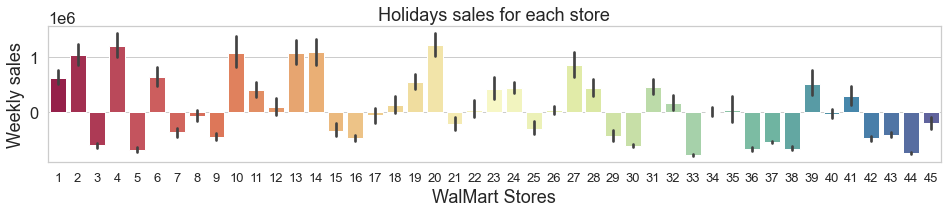

In [43]:
#######################################################################################################
# plot the graph of holiday week sales minus mean regular week sales 
#######################################################################################################
plt.figure(figsize=(16,2.5))
sns.barplot(data=WData_Holiday,y=WData_Holiday['Holiday_Minus_Regular_Week_sales'],x=WData_Holiday.Store,palette='Spectral') 
plt.title('Holidays sales for each store')
plt.ylabel('Weekly sales')
plt.xlabel('WalMart Stores')
plt.xticks(fontsize=13)
plt.show()

In [44]:
#######################################################################################################
# extract month and year fields to use in calculating monthly and semester wise sales 
#######################################################################################################

WData['Year'] = WData['Date'].dt.year

WData['Month'] = WData['Date'].dt.month


def semester_calculator(row):
    if row.Month > 6:
        return 2
    else:
        return 1

WData['Semester'] = WData.apply(lambda row: semester_calculator(row), axis=1)

In [45]:
#######################################################################################################
# sort and view data by store/year/month/semester
#######################################################################################################
WDataYearMonthSort = WData.sort_values(by=['Store','Year','Month'])
WDataYearMonthSort

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Holiday_Events,Year,Month,Semester
34,1,2010-01-10,1453329.50,0,71.89,2.603,211.671989,7.838,0,2010,1,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,0,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,0,2010,2,1
8,1,2010-02-04,1594968.28,0,62.27,2.719,210.820450,7.808,0,2010,2,1
21,1,2010-02-07,1492418.14,0,80.91,2.669,211.223533,7.787,0,2010,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...
6423,45,2012-10-08,733037.32,0,78.65,3.722,191.162613,8.684,0,2012,10,2
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667,0,2012,10,2
6434,45,2012-10-26,760281.43,0,58.85,3.882,192.308899,8.667,0,2012,10,2
6410,45,2012-11-05,770487.37,0,61.24,3.889,190.976417,8.567,0,2012,11,2


In [46]:
#######################################################################################################
# create an index on store/year/month and view the sorted values 
#######################################################################################################
MonthlySALES = WDataYearMonthSort.groupby(by=['Store','Year','Month']).sum()
MonthlySALES = MonthlySALES.iloc[0:,0:1]
MonthlySALES.rename(columns={'Weekly_Sales':'Monthly_Sales'},inplace=True)
MonthlySALES

Monthly_Sales
Store Year Month               
1     2010 1         1453329.50
           2         6109082.18
           3         5965143.02
           4         5897939.82
           5         9076140.38
...                         ...
45    2012 8         2970160.06
           9         2915467.29
           10        3015101.40
           11         770487.37
           12         734464.36

[1620 rows x 1 columns]

In [47]:
#######################################################################################################
# top 5 store/year/month sales - all in december 
#######################################################################################################
MonthlySALES.sort_values(by='Monthly_Sales',ascending=False).head()

,,,Monthly_Sales
Store,Year,Month,
20,2010,12,14693466.41
10,2010,12,14281278.92
14,2010,12,14157707.28
4,2010,12,14144065.01
13,2010,12,13854427.04


In [48]:
#######################################################################################################
# bottom 5 store/year/month sales - most in january 2010 
#######################################################################################################
MonthlySALES.sort_values(by='Monthly_Sales',ascending=False).tail()

Monthly_Sales
Store Year Month               
44    2010 1          300152.45
33    2012 11         295841.84
           12         291781.15
5     2010 1          283178.12
33    2010 1          224294.39

In [49]:
printmd('Monthly sales analysis of 45 stores')

## <span style="color:#1111cc">Monthly sales analysis of 45 stores</span>

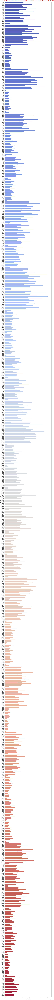

In [50]:
#######################################################################################################
# plot the graph of monthly sales for each month from Jan 2010 thru Dec 2012 for all 45 stores 
#######################################################################################################
plt.figure(figsize=(16,350))
MonthlySALES['Store-Year-Month'] = MonthlySALES.index.get_level_values(0).astype(str) + '-' + \
                    MonthlySALES.index.get_level_values(1).astype(str) + '-' + \
                    MonthlySALES.index.get_level_values(2).astype(str).str.zfill(2)



sns.barplot(data=MonthlySALES,y=MonthlySALES['Store-Year-Month'],x=MonthlySALES['Monthly_Sales'], \
            palette='coolwarm',orient='h')

fontdict ={'fontsize': 20,'color': 'red','verticalalignment': 'bottom','horizontalalignment': 'center'}


plt.title('Walmart Monthly sales on same scale from Jan 2010 to Dec 2012 for \
45 stores ("Y" label is Store-Year-Month)',fontdict=fontdict)
plt.yticks(fontsize=11)
plt.show()


In [51]:
printmd('Stores 3,5,7,8,9,15,16,21,25,29,30,33,36,37,38,42,43 and 44 has very poor monthly sales compared to other stores')

## <span style="color:#1111cc">Stores 3,5,7,8,9,15,16,21,25,29,30,33,36,37,38,42,43 and 44 has very poor monthly sales compared to other stores</span>

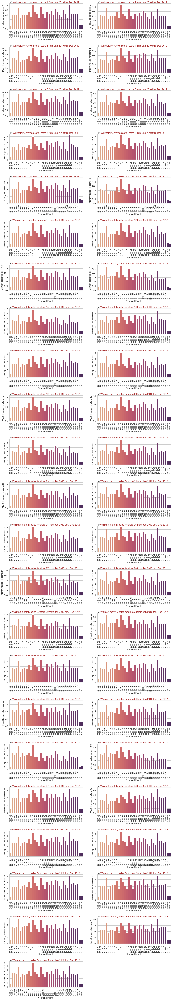

In [52]:
#######################################################################################################
# plot the graph of monthly sales for each month from Jan 2010 thru Dec 2012 for all 45 stores individully
#######################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(16,100))
k = 0
WDatast={}
plt.subplots_adjust(hspace=.7,wspace=.2)
for i in range(1,46):
    WDatast[i] = WData[WData.Store==i]
    WDataYearMonthSort1 = WDatast[i].sort_values(by=['Year','Month'])
    MonthlySALES1 = WDataYearMonthSort1.groupby(by=['Store','Year','Month']).sum()
    MonthlySALES1 = MonthlySALES1.iloc[0:,0:1]
    MonthlySALES1.rename(columns={'Weekly_Sales':'Monthly_Sales'},inplace=True)
    
    MonthlySALES1['Year-Month'] = MonthlySALES1.index.get_level_values(1).astype(str) + '-' + \
                        MonthlySALES1.index.get_level_values(2).astype(str).str.zfill(2)
    
    k += 1
    plt.subplot(23,2,k)

    sns.barplot(data=MonthlySALES1,x=MonthlySALES1['Year-Month'],y=MonthlySALES1['Monthly_Sales'], \
                palette='flare',orient='v')

    
    plt.ylabel('Monthly sales for store '+str(i))
    plt.xlabel('Year and Month ')
    plt.xticks(rotation=90)
    fontdict ={'fontsize': 13,'color': 'brown','verticalalignment': 'center','horizontalalignment': 'center'}
    plt.title('Walmart monthly sales for store '+ str(i)+' from Jan 2010 thru Dec 2012',fontdict=fontdict )

plt.show()
    


In [53]:
printmd('Semester sales analysis for all 45 stores')

## <span style="color:#1111cc">Semester sales analysis for all 45 stores</span>

In [54]:
#######################################################################################################
# group, sum, sort and create index by store/year/semester 
#######################################################################################################
SemesterSALES = WDataYearMonthSort.groupby(by=['Store','Year','Semester']).sum()
SemesterSALES = SemesterSALES.iloc[0:,0:1]
SemesterSALES.rename(columns={'Weekly_Sales':'Semester_Sales'},inplace=True)
SemesterSALES

Semester_Sales
Store Year Semester                
1     2010 1            33033122.34
           2            40245709.66
      2011 1            38293559.24
           2            42628359.59
      2012 1            39988063.27
...                             ...
45    2010 2            21159437.76
      2011 1            19097393.74
           2            22037974.14
      2012 1            19352334.72
           2            13371295.45

[270 rows x 1 columns]

In [55]:
#######################################################################################################
# top 5 store/year/semester sales - all in second semester
#######################################################################################################
SemesterSALES.sort_values(by='Semester_Sales',ascending=False).head()

Semester_Sales
Store Year Semester                
4     2011 2            59853414.86
20    2011 2            58589254.37
14    2010 2            57093230.93
      2011 2            56684510.20
13    2011 2            56508455.94

In [56]:
#######################################################################################################
# bottom 5 store/year/semester sales - mostly in 2012 second semester as well
#######################################################################################################
SemesterSALES.sort_values(by='Semester_Sales',ascending=False).tail()

,,,Semester_Sales
Store,Year,Semester,
44,2012,2,6043469.84
33,2010,1,5983371.63
5,2012,2,5828746.31
36,2012,2,5403417.64
33,2012,2,4853144.96


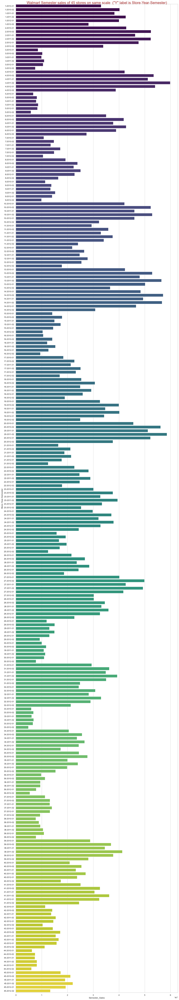

In [57]:
#######################################################################################################
# plot the graph of semester sales for all 45 stores from Jan 2010 thru Dec 2012 
#######################################################################################################
plt.figure(figsize=(16,100))
SemesterSALES['Store-Year-Semester'] = SemesterSALES.index.get_level_values(0).astype(str) + '-' + \
                    SemesterSALES.index.get_level_values(1).astype(str) + '-' + \
                    SemesterSALES.index.get_level_values(2).astype(str).str.zfill(2)

sns.barplot(data=SemesterSALES,y=SemesterSALES['Store-Year-Semester'],x=SemesterSALES['Semester_Sales'], \
            palette='viridis',orient='h')
fontdict ={'fontsize': 20,'color': 'brown','verticalalignment': 'center','horizontalalignment': 'center'}
plt.title('Walmart Semester sales of 45 stores on same scale  \
("Y" label is Store-Year-Semester)',fontdict=fontdict)
plt.show()


In [58]:
printmd('Stores 3,5,7,30,33 and 44 has very poor semester wise sales compared to other stores')

## <span style="color:#1111cc">Stores 3,5,7,30,33 and 44 has very poor semester wise sales compared to other stores</span>

In [59]:
#######################################################################################################
# store the sorted data in the original variable to build the linear regression model 
#######################################################################################################

WData = WDataYearMonthSort
WData.head(3)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Holiday_Events,Year,Month,Semester
34,1,2010-01-10,1453329.50,0,71.89,2.603,211.671989,7.838,0,2010,1,1
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,0,2010,2,1
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,0,2010,2,1


In [60]:
#######################################################################################################
# see how many unique dates/weeks are there in the input file
#######################################################################################################
WData.Date.nunique()

143

In [61]:
printmd('Walmart Store 1 Linear Regression model to predict sales')

## <span style="color:#1111cc">Walmart Store 1 Linear Regression model to predict sales</span>

In [62]:
#######################################################################################################
# Extract the data for store 1 to build regrssion model
#######################################################################################################
WData_ST1 = WData[WData['Store'] == 1]

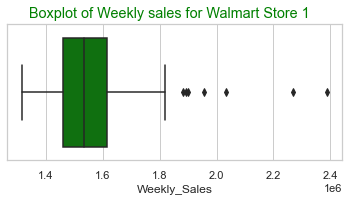

In [63]:
#######################################################################################################
# plot the boxplot of weekly sales for store 1 to check outliers 
#######################################################################################################
plt.figure(figsize=(6,2.5))
sns.boxplot(x=WData_ST1['Weekly_Sales'],color='green')
fontdict={'fontsize':20,'color':'green','fontweight':'bold'}
plt.suptitle('Boxplot of Weekly sales for Walmart Store 1',fontdict=fontdict)
plt.show()

In [64]:
#######################################################################################################
# now let us remove the outliers from the store 1 file 
#######################################################################################################
WData_ST1 = WData_ST1[WData_ST1['Weekly_Sales'] <= 1850000.00]
WData_ST1.shape

(136, 12)

In [65]:
#######################################################################################################
# convert the date field from string to date format
#######################################################################################################
WData_ST1.Date = WData_ST1['Date'].dt.date

In [66]:
#######################################################################################################
# calculate number of days from today to the dates in the input file and store in a new days field
#######################################################################################################
def days_calculator(row):
    dateToday = date.today()
    daydelta = dateToday - row.Date
    return (daydelta.days)
    

WData_ST1['Days'] = WData_ST1.apply(lambda row: days_calculator(row), axis=1)
WData_ST1.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Holiday_Events,Year,Month,Semester,Days
34,1,2010-01-10,1453329.50,0,71.89,2.603,211.671989,7.838,0,2010,1,1,4281
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,0,2010,2,1,4241
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,0,2010,2,1,4234
8,1,2010-02-04,1594968.28,0,62.27,2.719,210.820450,7.808,0,2010,2,1,4256
21,1,2010-02-07,1492418.14,0,80.91,2.669,211.223533,7.787,0,2010,2,1,4253


In [67]:
#######################################################################################################
# extract and store dependent and independent variables seperatly
#######################################################################################################
x = WData_ST1[['Holiday_Flag','Temperature','Fuel_Price','CPI','Unemployment','Holiday_Events','Year','Month','Semester','Days']]
y = WData_ST1.iloc[:,2]

In [68]:
#######################################################################################################
# look at the first five rows of the independent varaiables files
#######################################################################################################
x.head()

,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,Holiday_Events,Year,Month,Semester,Days
34,0,71.89,2.603,211.671989,7.838,0,2010,1,1,4281
2,0,39.93,2.514,211.289143,8.106,0,2010,2,1,4241
3,0,46.63,2.561,211.319643,8.106,0,2010,2,1,4234
8,0,62.27,2.719,210.820450,7.808,0,2010,2,1,4256
21,0,80.91,2.669,211.223533,7.787,0,2010,2,1,4253


In [69]:
#######################################################################################################
# look at the first five rows from the dependent variable file
#######################################################################################################
y.head()

34    1453329.50
2     1611968.17
3     1409727.59
8     1594968.28
21    1492418.14
Name: Weekly_Sales, dtype: float64

In [70]:
#######################################################################################################
# load the train test split module from sklearn
#######################################################################################################
from sklearn.model_selection import train_test_split

In [71]:
#######################################################################################################
# split the independent and dependent files into test and train files ,stratify=y
#######################################################################################################
Wxtrain,Wxtest,Wytrain,Wytest=train_test_split(x,y,test_size=0.2,random_state=1)

In [72]:
#######################################################################################################
# look at the shapes of the split train test files
#######################################################################################################
Wxtrain.shape, Wxtest.shape, Wytrain.shape, Wytest.shape

((108, 10), (28, 10), (108,), (28,))

In [73]:
#######################################################################################################
# from sklearn load,instantiate and fit transform standardscalar module to scale the train files
#######################################################################################################
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
Wxtrain_scaled = scalar.fit_transform(Wxtrain)

In [74]:
#######################################################################################################
# from sklearn load,instantiate and fit linearRegression module to build model 
#######################################################################################################
from sklearn.linear_model import LinearRegression
Lreg = LinearRegression(normalize=False,copy_X=True,fit_intercept=True, n_jobs=-1)
Lreg.fit(Wxtrain_scaled,Wytrain)

LinearRegression(n_jobs=-1)

In [75]:
#######################################################################################################
# scale / transform the test files
#######################################################################################################
Wxtest_scaled = scalar.transform(Wxtest)

In [76]:
#######################################################################################################
# predict using linear regression model on the test file
#######################################################################################################
Wypred = Lreg.predict(Wxtest_scaled)

In [77]:
#######################################################################################################
# look at the top 5 rows of actual and predicted values at the same time
#######################################################################################################
import numpy as np
pd.DataFrame({'Actual :':Wytest,'Predicted :': np.round(Wypred,2)}).head()

,Actual :,Predicted :
5,1439541.59,1592426.34
37,1345454.00,1444057.86
99,1497462.72,1422486.21
6,1472515.79,1512801.88
68,1466046.67,1473899.79


In [78]:
#######################################################################################################
# load the metrics modules to evaluate the model
#######################################################################################################
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error,median_absolute_error



In [79]:
#######################################################################################################
# calculate and print the r squared values using actual and predicted values
#######################################################################################################
R2Squared = r2_score(Wytest,Wypred)
print('R Squared Value is : ', np.round(R2Squared,2))


R Squared Value is :  0.18


In [80]:
#######################################################################################################
# calculate and print the mean absolute error values using true and predicted values
#######################################################################################################
MAE = mean_absolute_error(Wytest,Wypred)
print('Mean Absolute Error is      : ', np.round(MAE,2))

Mean Absolute Error is      :  51635.06


In [81]:
#######################################################################################################
# calculate and print median absolute error value using true and predicted values
#######################################################################################################
MedianAE = median_absolute_error(Wytest,Wypred)
print('Median Absolute Error is      : ', np.round(MedianAE,2))

Median Absolute Error is      :  39127.75


In [82]:
#######################################################################################################
# calculate and print root mean squared error value uing true and predicted values
#######################################################################################################
RMSE = np.sqrt(mean_squared_error(Wytest,Wypred))
print('Root Mean Squared Error is      : ', np.round(RMSE,2))

Root Mean Squared Error is      :  63740.5


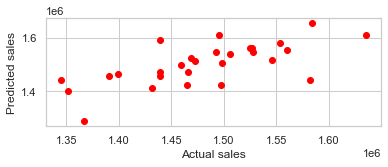

In [83]:
#######################################################################################################
# plot the scatter graph of true and predicted values
#######################################################################################################
plt.figure(figsize=(6,2))
plt.scatter(Wytest,Wypred,c='red')
plt.xlabel('Actual sales')
plt.ylabel('Predicted sales')
plt.show()

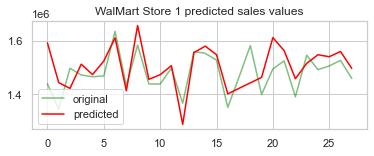

In [84]:
####################################################################################
# Linear Regression plot the graph of true and predicted values
####################################################################################

plt.figure(figsize=(6,2))
ax = range(len(Wytest))
plt.plot(ax, Wytest, label="original",alpha=.5,color='green')
plt.plot(ax, Wypred, label="predicted",color='red')
plt.title("WalMart Store 1 predicted sales values")
plt.legend()
plt.show()



      Prediction Error Plot


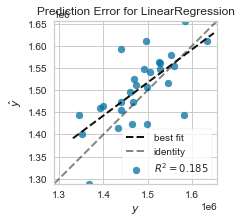

In [85]:
####################################################################################
# plot the Prediction Error graph
####################################################################################

from yellowbrick.regressor import prediction_error
try:
    plt.figure(figsize=(3,3))
    print("\n      Prediction Error Plot")
    prediction_error(Lreg, Wxtrain_scaled, Wytrain, Wxtest_scaled, Wytest)
    plt.show()
except:
    AttributeError
     


                                                  Residuals Plot


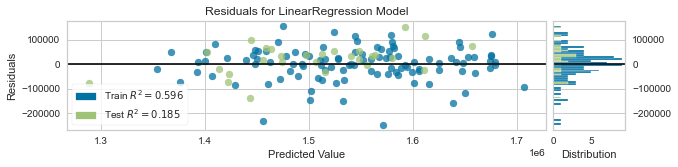

In [86]:
####################################################################################
# plot the Residuals graph
####################################################################################
from yellowbrick.regressor import residuals_plot
try:
    plt.figure(figsize=(10,2))
    print("\n                                                  Residuals Plot")
    print(residuals_plot(Lreg, Wxtrain_scaled, Wytrain, Wxtest_scaled, Wytest))
except:
    AttributeError
    

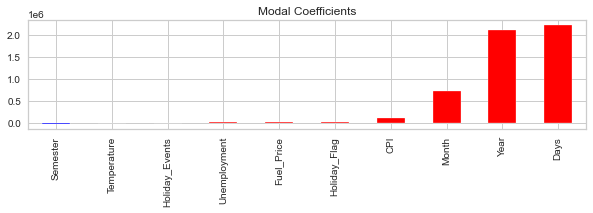

In [87]:
#######################################################################################################
# plot the graph of coefficients of independent varaibles used in the model 
#######################################################################################################
plt.figure(figsize=(10,2))
predictors = x.columns
coef1 = pd.Series(Lreg.coef_,predictors).sort_values()
features = pd.DataFrame()
features['importance'] = coef1
features['positive'] = features['importance'] > 0
coef1.plot(kind='bar', title='Modal Coefficients',color=features.positive.map({True:'red', False:'blue'}))
plt.show()

In [88]:
printmd('OLS Statsmodel regression')

## <span style="color:#1111cc">OLS Statsmodel regression</span>

In [89]:
#######################################################################################################
# run through the OLS model to view the p-vales, coeffieicnts, r squared and other details
#######################################################################################################


import statsmodels.formula.api as smf
lm = smf.ols('Weekly_Sales ~ Holiday_Flag+Temperature+Fuel_Price+CPI+Unemployment+Holiday_Events+Year+Month+Semester+Days', \
             data=WData_ST1).fit()


In [90]:
#######################################################################################################
# print the OLS Regression model summary
#######################################################################################################
lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Weekly_Sales   R-squared:                       0.594
Model:                            OLS   Adj. R-squared:                  0.562
Method:                 Least Squares   F-statistic:                     18.29
Date:                Thu, 30 Sep 2021   Prob (F-statistic):           3.27e-20
Time:                        23:39:58   Log-Likelihood:                -1701.2
No. Observations:                 136   AIC:                             3424.
Df Residuals:                     125   BIC:                             3456.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -5.016e+09    5.3e+08     -9.466      0.000   -6.06e+09   -3.97e+09
Holiday_Flag    7.327e+04   3.32e+04      2.206      0.029    7527.094    1.39e+05
Temperature     -734.7148    497.787     -1.476      0.142   -1719.898     250.468
Fuel_Price      2.837e+04   2.85e+04      0.994      0.322   -2.81e+04    8.49e+04
CPI             2.567e+04   5361.595      4.788      0.000    1.51e+04    3.63e+04
Unemployment    1.547e+04   3.15e+04      0.491      0.624   -4.69e+04    7.79e+04
Holiday_Events -2.581e+04   1.53e+04     -1.689      0.094   -5.61e+04    4435.000
Year            2.478e+06   2.62e+05      9.457      0.000    1.96e+06       3e+06
Month           2.167e+05   2.17e+04      9.965      0.000    1.74e+05     2.6e+05
Semester       -5.374e+04   2.45e+04     -2.197      0.030   -1.02e+05   -5335.140
Days            7040.2365    723.433      9.732      0.000    5608.473    8472.000
==============================================================================
Omnibus:                       26.903   Durbin-Watson:                   1.711
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               47.008
Skew:                           0.915   Prob(JB):                     6.20e-11
Kurtosis:                       5.224   Cond. No.                     3.87e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.87e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [91]:
printmd('For store 1, Fuel Price,Unemployment and Temperature has no substantial impact on sales;')
printmd('CPI,Holiday_Flag,Year, Month and Days has some impact')

## <span style="color:#1111cc">For store 1, Fuel Price,Unemployment and Temperature has no substantial impact on sales;</span>

## <span style="color:#1111cc">CPI,Holiday_Flag,Year, Month and Days has some impact</span>

In [92]:
printmd('Now lets run through other models to comapre the results')

## <span style="color:#1111cc">Now lets run through other models to comapre the results</span>

In [93]:
printmd('Walmart Store 1 Decision Tree Regression')

## <span style="color:#1111cc">Walmart Store 1 Decision Tree Regression</span>

In [94]:
#######################################################################################################
# Let us run through Decision Tree Regressor Model to comapre the results 
#######################################################################################################

from sklearn.tree import DecisionTreeRegressor
DTReg = DecisionTreeRegressor()
DTReg.fit(Wxtrain_scaled,Wytrain)

print('Decision Tree Regressor RMSE Value:',np.round(np.sqrt(mean_squared_error(Wytest, \
                                                                    DTReg.predict(Wxtest_scaled))),2))
print('Decision Tree Regressor R2 Value  : {}'.format(np.round(DTReg.score(Wxtest_scaled, \
                                                                                          Wytest),2)))

Decision Tree Regressor RMSE Value: 127354.05
Decision Tree Regressor R2 Value  : -2.25


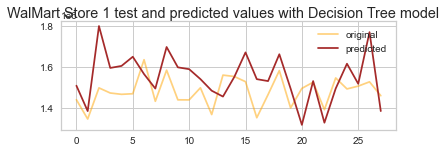

In [95]:
#######################################################################################################
#  plot the graph of true and predicted values for Decision Tree Model
#######################################################################################################

plt.figure(figsize=(6,2))
ax = range(len(Wytest))
plt.plot(ax, Wytest, label="original",alpha=.5,color='orange')
plt.plot(ax, DTReg.predict(Wxtest_scaled), label="predicted",color='brown')
plt.suptitle("WalMart Store 1 test and predicted values with Decision Tree model")
plt.legend()
plt.show()


In [96]:
printmd('Walmart Store 1 Ridge regression')

## <span style="color:#1111cc">Walmart Store 1 Ridge regression</span>

In [97]:
#######################################################################################################
# Now lets run through Ridge Model to comapre the results 
#######################################################################################################

from sklearn.linear_model import Ridge
ridgeReg = Ridge(alpha=0.001, normalize=True)
ridgeReg.fit(Wxtrain_scaled,Wytrain)

print('Ridge RMSE Value :', np.round(np.sqrt(mean_squared_error(Wytest, ridgeReg.predict(Wxtest_scaled))),2))
print('Ridge R2 Value   : {}'.format(np.round(ridgeReg.score(Wxtest_scaled, Wytest),2)))


Ridge RMSE Value : 68044.22
Ridge R2 Value   : 0.07


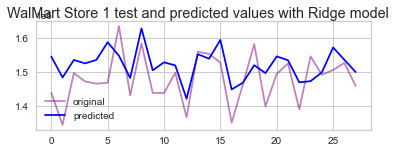

In [98]:
####################################################################################
#  plot the graph of true and predicted values for Ridge Model
####################################################################################

plt.figure(figsize=(6,2))
ax = range(len(Wytest))
plt.plot(ax, Wytest, label="original",alpha=.5,color='purple')
plt.plot(ax, ridgeReg.predict(Wxtest_scaled), label="predicted",color='blue')
plt.suptitle("WalMart Store 1 test and predicted values with Ridge model")
plt.legend()
plt.show()


In [99]:
printmd('Walmart Store 1 Lasso regression')

## <span style="color:#1111cc">Walmart Store 1 Lasso regression</span>

In [100]:
#######################################################################################################
# Now lets run thorugh LASSO Model and compare the results 
#######################################################################################################

from sklearn.linear_model import Lasso
lassoreg = Lasso(alpha=0.001, normalize=True)
lassoreg.fit(Wxtrain_scaled,Wytrain)

print('Lasso RMSE Value:',np.round(np.sqrt(mean_squared_error(Wytest, lassoreg.predict(Wxtest_scaled))),2))
print('Lasso R2 Value  : {}'.format(np.round(lassoreg.score(Wxtest_scaled, Wytest),2)))

Lasso RMSE Value: 61577.51
Lasso R2 Value  : 0.24


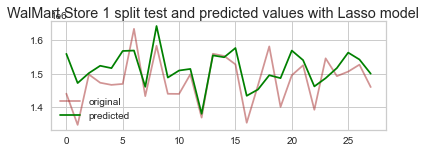

In [101]:
####################################################################################
#  plot the graph of true and predicted values for LASSO Model
####################################################################################

plt.figure(figsize=(6,2))
ax = range(len(Wytest))
plt.plot(ax, Wytest, label="original",alpha=.5,color='brown')
plt.plot(ax, lassoreg.predict(Wxtest_scaled), label="predicted",color='green')
plt.suptitle("WalMart Store 1 split test and predicted values with Lasso model")
plt.legend()
plt.show()


In [102]:
printmd('Walmart Store 1 ElasticNet regression')

## <span style="color:#1111cc">Walmart Store 1 ElasticNet regression</span>

In [103]:
#######################################################################################################
# Now lets run through ElasticNet Model to compare the results 
#######################################################################################################

from sklearn.linear_model import ElasticNet
Elastic = ElasticNet(alpha=0.001, normalize=True)
Elastic.fit(Wxtrain_scaled,Wytrain)

print('ElasticNet RMSE Value :',np.round(np.sqrt(mean_squared_error(Wytest, Elastic.predict(Wxtest_scaled))),2))
print('ElasticNet R2 Value   : {}'.format(np.round(Elastic.score(Wxtest_scaled, Wytest),2)))

ElasticNet RMSE Value : 79571.88
ElasticNet R2 Value   : -0.27


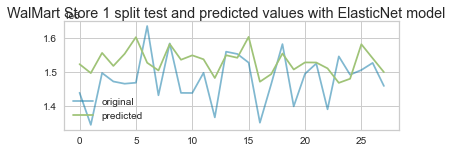

In [104]:
####################################################################################
#  plot the graph of true and predicted values for ElasticNet model
####################################################################################

plt.figure(figsize=(6,2))
ax = range(len(Wytest))
plt.plot(ax, Wytest, label="original",alpha=.5)
plt.plot(ax, Elastic.predict(Wxtest_scaled), label="predicted")
plt.suptitle("WalMart Store 1 split test and predicted values with ElasticNet model")
plt.legend()
plt.show()


In [105]:
printmd('Walmart Store 1 Random Forest regression')

## <span style="color:#1111cc">Walmart Store 1 Random Forest regression</span>

In [106]:
#######################################################################################################
# Lets run through Random Forest Regressor to compare the results and calculate its rmse 
#######################################################################################################

from sklearn.ensemble import RandomForestRegressor
rfrmodel = RandomForestRegressor(n_estimators=20, random_state=101)
rfrmodel.fit(Wxtrain_scaled,Wytrain)
rfrmodel_pred= rfrmodel.predict(Wxtest_scaled)
rfrmodel_rmse=np.sqrt(mean_squared_error(rfrmodel_pred, Wytest))
print("RMSE value for Random forest regression is :",np.round(rfrmodel_rmse,2))
print('R2 Value for Random forest regression is   : {}'.format(np.round(rfrmodel.score(Wxtest_scaled, Wytest),2)))

RMSE value for Random forest regression is : 103238.2
R2 Value for Random forest regression is   : -1.14


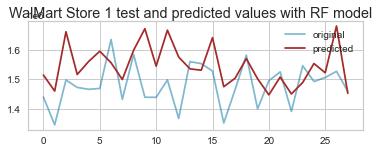

In [107]:
####################################################################################
#  plot the graph of true and predicted values for RandomForest
####################################################################################

plt.figure(figsize=(6,2))
ax = range(len(Wytest))
plt.plot(ax, Wytest, label="original",alpha=.5)
plt.plot(ax, rfrmodel_pred, label="predicted",color='brown')
plt.suptitle("WalMart Store 1 test and predicted values with RF model")
plt.legend()
plt.show()


In [108]:
printmd('Walmart Store 1 Linear regression with just 2 variables')

## <span style="color:#1111cc">Walmart Store 1 Linear regression with just 2 variables</span>

In [109]:
#######################################################################################################
# now lets try linear regression with those variables with p-value less than .05
#######################################################################################################

In [110]:
#######################################################################################################
# Linear Regression Model with just 2 independent variables 
#######################################################################################################


x2 = WData_ST1[['Temperature','Month']]

y2 = WData_ST1.iloc[:,2]

In [111]:
#######################################################################################################
# split the independent and dependent files into train and test files
#######################################################################################################
Wx2train,Wx2test,Wy2train,Wy2test=train_test_split(x2,y2,test_size=0.3,random_state=1)  #,stratify=y2

In [112]:
#######################################################################################################
# instantiate and fit the linear regressor model on these 2 independent variables
#######################################################################################################
Lreg2 = LinearRegression(normalize=False,copy_X=True,fit_intercept=True, n_jobs=-1)
Wx2train_scaled = scalar.fit_transform(Wx2train)
Lreg2.fit(Wx2train_scaled,Wy2train)

LinearRegression(n_jobs=-1)

In [113]:
#######################################################################################################
# scale the test file
#######################################################################################################
Wx2test_scaled = scalar.transform(Wx2test)

In [114]:
#######################################################################################################
# predict on the scaled test file
#######################################################################################################
Wy2pred = Lreg2.predict(Wx2test_scaled)

In [115]:
#######################################################################################################
# view the top 5 true and predicted values
#######################################################################################################
pd.DataFrame({'Actual :':Wy2test,'Predicted :':np.round(Wy2pred,2)}).head()

,Actual :,Predicted :
5,1439541.59,1584021.83
37,1345454.00,1554821.99
99,1497462.72,1607909.91
6,1472515.79,1556411.21
68,1466046.67,1522083.91


In [116]:
#######################################################################################################
# calculate and print the r squared value
#######################################################################################################
R2Squared2 = r2_score(Wy2test,Wy2pred)
print('R Squared Value is : ', np.round(R2Squared2,2))


R Squared Value is :  -0.55


In [117]:
#######################################################################################################
# Calculate and print the root mean squared error value
#######################################################################################################
RMSE2 = np.sqrt(mean_squared_error(Wy2test,Wy2pred))
print('Root Mean Squared Error is      : ', np.round(RMSE2,2))

Root Mean Squared Error is      :  103662.33


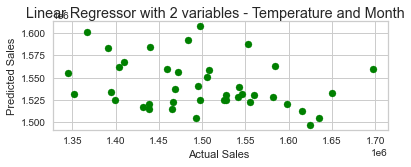

In [118]:
#######################################################################################################
# scatter plot the graph of true and predicted sales for linear regressor model
# with only 2 independent variables - Temperature and Month
#######################################################################################################
plt.figure(figsize=(6,2))
plt.scatter(Wy2test,Wy2pred,color='green')
plt.xlabel('Actual Sales ')
plt.ylabel('Predicted Sales')
plt.suptitle('Linear Regressor with 2 variables - Temperature and Month')
plt.show()

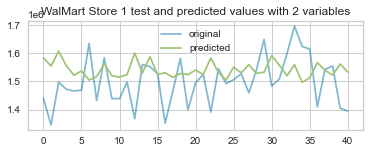

In [119]:
####################################################################################
# plot the graph of true and predicted values with 2 variables LR Model
####################################################################################

plt.figure(figsize=(6,2))
ax = range(len(Wy2test))
plt.plot(ax, Wy2test, label="original",alpha=.5)
plt.plot(ax, Wy2pred, label="predicted")
plt.title("WalMart Store 1 test and predicted values with 2 variables")
plt.legend()
plt.show()


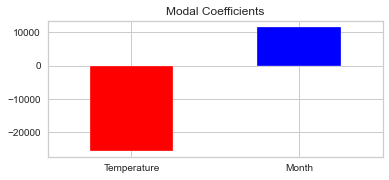

In [120]:
#######################################################################################################
# plot the coefficients of the 2 variables used and see there impact on sales
#######################################################################################################
plt.figure(figsize=(6,2.5))
predictors = x2.columns
coef = pd.Series(Lreg2.coef_,predictors).sort_values()
features = pd.DataFrame()
features['importance'] = coef
features['positive'] = features['importance'] > 0
coef.plot(kind='bar', title='Modal Coefficients',color = features.positive.map({True: 'blue', False: 'red'}))
plt.xticks(rotation=0)
plt.show()

In [121]:
#######################################################################################################
# Run through the OLS Model with just 2 variables Temperature and Month to get the details
#######################################################################################################

lm2 = smf.ols(formula= 'Weekly_Sales ~ Temperature+Month', data=WData_ST1).fit()



In [122]:
#######################################################################################################
# Print the OLS summary for those 2 variables
#######################################################################################################
lm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:           Weekly_Sales   R-squared:                       0.015
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9935
Date:                Thu, 30 Sep 2021   Prob (F-statistic):              0.373
Time:                        23:40:02   Log-Likelihood:                -1761.5
No. Observations:                 136   AIC:                             3529.
Df Residuals:                     133   BIC:                             3538.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept     1.59e+06   4.52e+04     35.143      0.000     1.5e+06    1.68e+06
Temperature  -882.6526    629.728     -1.402      0.163   -2128.230     362.925
Month         147.2303   2779.184      0.053      0.958   -5349.888    5644.349
==============================================================================
Omnibus:                        0.434   Durbin-Watson:                   1.424
Prob(Omnibus):                  0.805   Jarque-Bera (JB):                0.507
Skew:                           0.130   Prob(JB):                        0.776
Kurtosis:                       2.854   Cond. No.                         361.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [123]:
printmd('Temerature and Month has no substantial effect on the sales and \
these 2 variables are not sufficient to build the model')


## <span style="color:#1111cc">Temerature and Month has no substantial effect on the sales and these 2 variables are not sufficient to build the model</span>

In [124]:
printmd("Linear Regrssion with all variables gave the \
reasonable R squared value of .59  so far compared to other models.") 
printmd("Let's try with Neural Networks.")

## <span style="color:#1111cc">Linear Regrssion with all variables gave the reasonable R squared value of .59  so far compared to other models.</span>

## <span style="color:#1111cc">Let's try with Neural Networks.</span>

In [125]:
printmd('WalMart Store 45 Neural Network Model')

## <span style="color:#1111cc">WalMart Store 45 Neural Network Model</span>

In [126]:
################################################################################################################################
# import the libraries for deep learning model building
################################################################################################################################
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model 
from tensorflow.keras import callbacks
from tensorflow.keras.callbacks import ModelCheckpoint 
from tensorflow.keras.layers import Dropout, Input
from tensorflow.keras.layers import Flatten, Dense, BatchNormalization 
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import tqdm 
import tensorflow_addons as tfa
tqdm_callback = tfa.callbacks.TQDMProgressBar()
import time


In [127]:
#######################################################################################################
# Extract the data for all stores to build regrssion model
#######################################################################################################
WData_ST1 = WData[WData['Store'] == 45]
WData_ST1.Date = WData_ST1['Date'].dt.date
WData_ST1['Days'] = WData_ST1.apply(lambda row: days_calculator(row), axis=1)
x = WData_ST1[['Holiday_Flag','Temperature','Fuel_Price','CPI','Unemployment','Holiday_Events','Year','Month','Semester','Days']]
y = WData_ST1.iloc[:,2]
Wxtrain,Wxtest,Wytrain,Wytest=train_test_split(x,y,test_size=0.2,random_state=1)
scalar = StandardScaler()
Wxtrain_scaled = scalar.fit_transform(Wxtrain)
Wxtest_scaled = scalar.transform(Wxtest)

In [128]:
Wxtrain_scaled.shape,Wytrain.shape,Wytrain.shape,Wytest.shape

((114, 10), (114,), (114,), (29,))

In [129]:
################################################################################################################################
# build the deep learnig model and compile for health care data analysis 
################################################################################################################################
def create_model(): 
    model = Sequential()
    model.add(Input(shape=(10,)))

    model.add(Dense(100, activation=tf.nn.relu, kernel_regularizer = tf.keras.regularizers.l2(0.000001)))  
    model.add(BatchNormalization())
    model.add(Dropout(.4))

    model.add(Dense(50, activation=tf.nn.relu, kernel_regularizer = tf.keras.regularizers.l2(0.000001))) 
    model.add(Dropout(.4))
    model.add(BatchNormalization())

    model.add(Dense(10, activation=tf.nn.relu, kernel_regularizer = tf.keras.regularizers.l1(0.000001))) 
    model.add(Dropout(.4))
    model.add(BatchNormalization())

    model.add(Flatten())
    model.add(Dense(1, activation=tf.nn.relu))

    opt = Adam(lr=0.02,beta_1=0.5)  

    model.compile(loss='mse', optimizer=opt, metrics=['mse'])
    return model

In [130]:
model = create_model()

In [131]:
################################################################################################################################
# define the path for the trained model from local directory and also define the checkpoints on val_loss
################################################################################################################################

FILEPATH="./Weights/weights_Walmart_Predictor_Dense1024_RSQ90.15store45_NEW90.78.hdf5"


RLROP_PAT = 5
DECAY_DROP = 0.95
Reduce_lr_on_plat=ReduceLROnPlateau(monitor='val_loss',mode='min',patience=RLROP_PAT,factor=DECAY_DROP,\
                                    min_lr=1e-19,verbose=2)


checkpoint = ModelCheckpoint(FILEPATH, monitor='val_loss', verbose=1, save_best_only=True, mode='min')
callback_list = [tqdm_callback, checkpoint,Reduce_lr_on_plat]

In [147]:
################################################################################################################################
# load the trained model
################################################################################################################################
#model = load_model(FILEPATH)
model.load_weights("./Weights/weights_Walmart_Predictor_Dense1024_RSQ90.15store45_NEW.hdf5")
opt = Adam(lr=1e-4,   beta_1=0.9)

model.compile(loss='mse', optimizer=opt, metrics=[ 'mse'])

################################################################################################################################
# print the summary of the loaded module
################################################################################################################################
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 100)               1100      
_________________________________________________________________
batch_normalization (BatchNo (None, 100)               400       
_________________________________________________________________
dropout (Dropout)            (None, 100)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 50)                5050      
_________________________________________________________________
dropout_1 (Dropout)          (None, 50)                0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 50)                200       
_________________________________________________________________
dense_2 (Dense)              (None, 10)                5

In [146]:
################################################################################################################################
# fit the built model and run it for 1500 epochs 4958579200.000
################################################################################################################################
history = model.fit(Wxtrain_scaled,Wytrain, validation_data=(Wxtest_scaled,Wytest), callbacks=callback_list,    
                    batch_size=36, epochs=100, verbose=0)    

Training:   0%|                                                                               0/100 ETA: ?s,  …

Epoch 1/100


0/4                                                                                                          E…


Epoch 00001: val_loss improved from 2535550720.00000 to 2376514816.00000, saving model to ./Weights\weights_Walmart_Predictor_Dense1024_RSQ90.15store45_NEW90.78.hdf5
Epoch 2/100


0/4                                                                                                          E…


Epoch 00002: val_loss did not improve from 2376514816.00000
Epoch 3/100


0/4                                                                                                          E…


Epoch 00003: val_loss did not improve from 2376514816.00000
Epoch 4/100


0/4                                                                                                          E…


Epoch 00004: val_loss did not improve from 2376514816.00000
Epoch 5/100


0/4                                                                                                          E…


Epoch 00005: val_loss did not improve from 2376514816.00000
Epoch 6/100


0/4                                                                                                          E…


Epoch 00006: val_loss did not improve from 2376514816.00000

Epoch 00006: ReduceLROnPlateau reducing learning rate to 9.499999760009814e-05.
Epoch 7/100


0/4                                                                                                          E…


Epoch 00007: val_loss did not improve from 2376514816.00000
Epoch 8/100


0/4                                                                                                          E…


Epoch 00008: val_loss did not improve from 2376514816.00000
Epoch 9/100


0/4                                                                                                          E…


Epoch 00009: val_loss did not improve from 2376514816.00000
Epoch 10/100


0/4                                                                                                          E…


Epoch 00010: val_loss did not improve from 2376514816.00000
Epoch 11/100


0/4                                                                                                          E…


Epoch 00011: val_loss did not improve from 2376514816.00000

Epoch 00011: ReduceLROnPlateau reducing learning rate to 9.02499959920533e-05.
Epoch 12/100


0/4                                                                                                          E…


Epoch 00012: val_loss did not improve from 2376514816.00000
Epoch 13/100


0/4                                                                                                          E…


Epoch 00013: val_loss did not improve from 2376514816.00000
Epoch 14/100


0/4                                                                                                          E…


Epoch 00014: val_loss did not improve from 2376514816.00000
Epoch 15/100


0/4                                                                                                          E…


Epoch 00015: val_loss did not improve from 2376514816.00000
Epoch 16/100


0/4                                                                                                          E…


Epoch 00016: val_loss did not improve from 2376514816.00000

Epoch 00016: ReduceLROnPlateau reducing learning rate to 8.573749619245064e-05.
Epoch 17/100


0/4                                                                                                          E…


Epoch 00017: val_loss did not improve from 2376514816.00000
Epoch 18/100


0/4                                                                                                          E…


Epoch 00018: val_loss did not improve from 2376514816.00000
Epoch 19/100


0/4                                                                                                          E…


Epoch 00019: val_loss did not improve from 2376514816.00000
Epoch 20/100


0/4                                                                                                          E…


Epoch 00020: val_loss did not improve from 2376514816.00000
Epoch 21/100


0/4                                                                                                          E…


Epoch 00021: val_loss did not improve from 2376514816.00000

Epoch 00021: ReduceLROnPlateau reducing learning rate to 8.145062311086804e-05.
Epoch 22/100


0/4                                                                                                          E…


Epoch 00022: val_loss did not improve from 2376514816.00000
Epoch 23/100


0/4                                                                                                          E…


Epoch 00023: val_loss did not improve from 2376514816.00000
Epoch 24/100


0/4                                                                                                          E…


Epoch 00024: val_loss did not improve from 2376514816.00000
Epoch 25/100


0/4                                                                                                          E…


Epoch 00025: val_loss did not improve from 2376514816.00000
Epoch 26/100


0/4                                                                                                          E…


Epoch 00026: val_loss did not improve from 2376514816.00000

Epoch 00026: ReduceLROnPlateau reducing learning rate to 7.737808919046074e-05.
Epoch 27/100


0/4                                                                                                          E…


Epoch 00027: val_loss did not improve from 2376514816.00000
Epoch 28/100


0/4                                                                                                          E…


Epoch 00028: val_loss did not improve from 2376514816.00000
Epoch 29/100


0/4                                                                                                          E…


Epoch 00029: val_loss did not improve from 2376514816.00000
Epoch 30/100


0/4                                                                                                          E…


Epoch 00030: val_loss did not improve from 2376514816.00000
Epoch 31/100


0/4                                                                                                          E…


Epoch 00031: val_loss did not improve from 2376514816.00000

Epoch 00031: ReduceLROnPlateau reducing learning rate to 7.350918749580159e-05.
Epoch 32/100


0/4                                                                                                          E…


Epoch 00032: val_loss did not improve from 2376514816.00000
Epoch 33/100


0/4                                                                                                          E…


Epoch 00033: val_loss did not improve from 2376514816.00000
Epoch 34/100


0/4                                                                                                          E…


Epoch 00034: val_loss did not improve from 2376514816.00000
Epoch 35/100


0/4                                                                                                          E…


Epoch 00035: val_loss did not improve from 2376514816.00000
Epoch 36/100


0/4                                                                                                          E…


Epoch 00036: val_loss did not improve from 2376514816.00000

Epoch 00036: ReduceLROnPlateau reducing learning rate to 6.983372950344346e-05.
Epoch 37/100


0/4                                                                                                          E…


Epoch 00037: val_loss did not improve from 2376514816.00000
Epoch 38/100


0/4                                                                                                          E…


Epoch 00038: val_loss did not improve from 2376514816.00000
Epoch 39/100


0/4                                                                                                          E…


Epoch 00039: val_loss did not improve from 2376514816.00000
Epoch 40/100


0/4                                                                                                          E…


Epoch 00040: val_loss did not improve from 2376514816.00000
Epoch 41/100


0/4                                                                                                          E…


Epoch 00041: val_loss did not improve from 2376514816.00000

Epoch 00041: ReduceLROnPlateau reducing learning rate to 6.634204510191921e-05.
Epoch 42/100


0/4                                                                                                          E…


Epoch 00042: val_loss did not improve from 2376514816.00000
Epoch 43/100


0/4                                                                                                          E…


Epoch 00043: val_loss did not improve from 2376514816.00000
Epoch 44/100


0/4                                                                                                          E…


Epoch 00044: val_loss did not improve from 2376514816.00000
Epoch 45/100


0/4                                                                                                          E…


Epoch 00045: val_loss did not improve from 2376514816.00000
Epoch 46/100


0/4                                                                                                          E…


Epoch 00046: val_loss did not improve from 2376514816.00000

Epoch 00046: ReduceLROnPlateau reducing learning rate to 6.302494111878331e-05.
Epoch 47/100


0/4                                                                                                          E…


Epoch 00047: val_loss did not improve from 2376514816.00000
Epoch 48/100


0/4                                                                                                          E…


Epoch 00048: val_loss did not improve from 2376514816.00000
Epoch 49/100


0/4                                                                                                          E…


Epoch 00049: val_loss did not improve from 2376514816.00000
Epoch 50/100


0/4                                                                                                          E…


Epoch 00050: val_loss did not improve from 2376514816.00000
Epoch 51/100


0/4                                                                                                          E…


Epoch 00051: val_loss did not improve from 2376514816.00000

Epoch 00051: ReduceLROnPlateau reducing learning rate to 5.9873694408452134e-05.
Epoch 52/100


0/4                                                                                                          E…


Epoch 00052: val_loss did not improve from 2376514816.00000
Epoch 53/100


0/4                                                                                                          E…


Epoch 00053: val_loss did not improve from 2376514816.00000
Epoch 54/100


0/4                                                                                                          E…


Epoch 00054: val_loss did not improve from 2376514816.00000
Epoch 55/100


0/4                                                                                                          E…


Epoch 00055: val_loss did not improve from 2376514816.00000
Epoch 56/100


0/4                                                                                                          E…


Epoch 00056: val_loss did not improve from 2376514816.00000

Epoch 00056: ReduceLROnPlateau reducing learning rate to 5.68800103792455e-05.
Epoch 57/100


0/4                                                                                                          E…


Epoch 00057: val_loss did not improve from 2376514816.00000
Epoch 58/100


0/4                                                                                                          E…


Epoch 00058: val_loss did not improve from 2376514816.00000
Epoch 59/100


0/4                                                                                                          E…


Epoch 00059: val_loss did not improve from 2376514816.00000
Epoch 60/100


0/4                                                                                                          E…


Epoch 00060: val_loss did not improve from 2376514816.00000
Epoch 61/100


0/4                                                                                                          E…


Epoch 00061: val_loss did not improve from 2376514816.00000

Epoch 00061: ReduceLROnPlateau reducing learning rate to 5.4036009169067255e-05.
Epoch 62/100


0/4                                                                                                          E…


Epoch 00062: val_loss did not improve from 2376514816.00000
Epoch 63/100


0/4                                                                                                          E…


Epoch 00063: val_loss did not improve from 2376514816.00000
Epoch 64/100


0/4                                                                                                          E…


Epoch 00064: val_loss did not improve from 2376514816.00000
Epoch 65/100


0/4                                                                                                          E…


Epoch 00065: val_loss did not improve from 2376514816.00000
Epoch 66/100


0/4                                                                                                          E…


Epoch 00066: val_loss did not improve from 2376514816.00000

Epoch 00066: ReduceLROnPlateau reducing learning rate to 5.133420836500591e-05.
Epoch 67/100


0/4                                                                                                          E…


Epoch 00067: val_loss did not improve from 2376514816.00000
Epoch 68/100


0/4                                                                                                          E…


Epoch 00068: val_loss did not improve from 2376514816.00000
Epoch 69/100


0/4                                                                                                          E…


Epoch 00069: val_loss did not improve from 2376514816.00000
Epoch 70/100


0/4                                                                                                          E…


Epoch 00070: val_loss did not improve from 2376514816.00000
Epoch 71/100


0/4                                                                                                          E…


Epoch 00071: val_loss did not improve from 2376514816.00000

Epoch 00071: ReduceLROnPlateau reducing learning rate to 4.876749881077558e-05.
Epoch 72/100


0/4                                                                                                          E…


Epoch 00072: val_loss did not improve from 2376514816.00000
Epoch 73/100


0/4                                                                                                          E…


Epoch 00073: val_loss did not improve from 2376514816.00000
Epoch 74/100


0/4                                                                                                          E…


Epoch 00074: val_loss did not improve from 2376514816.00000
Epoch 75/100


0/4                                                                                                          E…


Epoch 00075: val_loss did not improve from 2376514816.00000
Epoch 76/100


0/4                                                                                                          E…


Epoch 00076: val_loss did not improve from 2376514816.00000

Epoch 00076: ReduceLROnPlateau reducing learning rate to 4.63291238702368e-05.
Epoch 77/100


0/4                                                                                                          E…


Epoch 00077: val_loss did not improve from 2376514816.00000
Epoch 78/100


0/4                                                                                                          E…


Epoch 00078: val_loss did not improve from 2376514816.00000
Epoch 79/100


0/4                                                                                                          E…


Epoch 00079: val_loss did not improve from 2376514816.00000
Epoch 80/100


0/4                                                                                                          E…


Epoch 00080: val_loss did not improve from 2376514816.00000
Epoch 81/100


0/4                                                                                                          E…


Epoch 00081: val_loss did not improve from 2376514816.00000

Epoch 00081: ReduceLROnPlateau reducing learning rate to 4.4012669059156905e-05.
Epoch 82/100


0/4                                                                                                          E…


Epoch 00082: val_loss did not improve from 2376514816.00000
Epoch 83/100


0/4                                                                                                          E…


Epoch 00083: val_loss did not improve from 2376514816.00000
Epoch 84/100


0/4                                                                                                          E…


Epoch 00084: val_loss did not improve from 2376514816.00000
Epoch 85/100


0/4                                                                                                          E…


Epoch 00085: val_loss did not improve from 2376514816.00000
Epoch 86/100


0/4                                                                                                          E…


Epoch 00086: val_loss did not improve from 2376514816.00000

Epoch 00086: ReduceLROnPlateau reducing learning rate to 4.181203439657111e-05.
Epoch 87/100


0/4                                                                                                          E…


Epoch 00087: val_loss did not improve from 2376514816.00000
Epoch 88/100


0/4                                                                                                          E…


Epoch 00088: val_loss did not improve from 2376514816.00000
Epoch 89/100


0/4                                                                                                          E…


Epoch 00089: val_loss did not improve from 2376514816.00000
Epoch 90/100


0/4                                                                                                          E…


Epoch 00090: val_loss did not improve from 2376514816.00000
Epoch 91/100


0/4                                                                                                          E…


Epoch 00091: val_loss did not improve from 2376514816.00000

Epoch 00091: ReduceLROnPlateau reducing learning rate to 3.9721430948702614e-05.
Epoch 92/100


0/4                                                                                                          E…


Epoch 00092: val_loss did not improve from 2376514816.00000
Epoch 93/100


0/4                                                                                                          E…


Epoch 00093: val_loss did not improve from 2376514816.00000
Epoch 94/100


0/4                                                                                                          E…


Epoch 00094: val_loss did not improve from 2376514816.00000
Epoch 95/100


0/4                                                                                                          E…


Epoch 00095: val_loss did not improve from 2376514816.00000
Epoch 96/100


0/4                                                                                                          E…


Epoch 00096: val_loss did not improve from 2376514816.00000

Epoch 00096: ReduceLROnPlateau reducing learning rate to 3.773536009248346e-05.
Epoch 97/100


0/4                                                                                                          E…


Epoch 00097: val_loss did not improve from 2376514816.00000
Epoch 98/100


0/4                                                                                                          E…


Epoch 00098: val_loss did not improve from 2376514816.00000
Epoch 99/100


0/4                                                                                                          E…


Epoch 00099: val_loss did not improve from 2376514816.00000
Epoch 100/100


0/4                                                                                                          E…


Epoch 00100: val_loss did not improve from 2376514816.00000


In [148]:
################################################################################################################################
# extract the variables for accuracy and loss reporting
################################################################################################################################
train_loss, train_acc = model.evaluate(Wxtrain_scaled,Wytrain, verbose=0,callbacks=[tqdm_callback])
test_loss, test_acc = model.evaluate(Wxtest_scaled,Wytest, verbose=0,callbacks=[tqdm_callback])
print('Train Accu: %.3f, Test Accu: %.3f' % (train_acc, test_acc))
print('Train Loss: %.3f, Test Loss: %.3f' % (train_loss, test_loss))



0/4                                                                                                ETA: ?s - E…

0/1                                                                                                ETA: ?s - E…

Train Accu: 8043468288.000, Test Accu: 2375009280.000
Train Loss: 8043468288.000, Test Loss: 2375009280.000


In [149]:
################################################################################################################################
# pridict on the split test dataset to calculate different error values
################################################################################################################################

y_Pred = model.predict(Wxtest_scaled)

In [150]:
################################################################################################################################
# calcualate the r squared values for split test dataset
################################################################################################################################

R_squared = r2_score(Wytest, y_Pred)
print("DNN Store 45 R-Squared value : ", np.round(R_squared, 8))


DNN Store 45 R-Squared value :  0.90777478


In [151]:
 y_Pred.shape,Wytest.shape,Wytest.shape[0]

((29, 1), (29,), 29)

In [152]:
y_Pred= y_Pred.reshape(Wytest.shape[0],)

In [153]:
################################################################################################################################
# pysically compare the true and predicted first 10 values
################################################################################################################################

pd.DataFrame({'Actual values ': Wytest, 'Predicted values ': y_Pred}).head(10)


,Actual values,Predicted values
6353,750182.71,7.543801e+05
6411,800842.28,7.993151e+05
6314,787062.00,7.287464e+05
6298,773819.49,7.977002e+05
6419,749817.08,7.427016e+05
6337,1123282.85,1.112784e+06
6296,777951.22,7.990901e+05
6332,765648.93,7.821166e+05
6340,680254.35,7.558798e+05
6381,771686.40,7.654036e+05


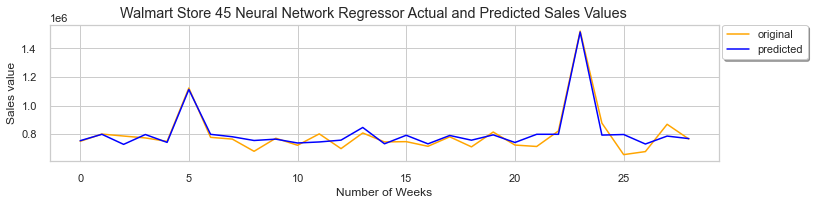

In [154]:
################################################################################################################################
# plot the graph of true and predicted values
################################################################################################################################
sns.set(style='whitegrid', palette='muted', font_scale=1.0)
plt.figure(figsize=(12,2.5))
ax = range(len(Wytest[0:150]))
plt.plot(ax, Wytest[0:150], color='orange',label="original")
plt.plot(ax, y_Pred[0:150], color='blue',label="predicted")
plt.suptitle("Walmart Store 45 Neural Network Regressor Actual and Predicted Sales Values")
plt.xlabel('Number of Weeks')
plt.ylabel('Sales value')
plt.legend(bbox_to_anchor=(0.64, .54, 0.5, 0.5),frameon=True,shadow=True)
plt.show()


In [155]:
################################################################################################################################
# import the regression metrics modules
# calculate the mean squared and root mean squared error values
################################################################################################################################
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error, r2_score
import math
print('Deep Neural Network Store 45 R2_Squared value is     : ', np.round(r2_score(Wytest,y_Pred)*100,2))
print('Deep Neural Network Store 45 Mean Absolute Error     : ', np.round(mean_absolute_error(Wytest,y_Pred),2))
print('Deep Neural Network Store 45 Mean Squared Error      : ', np.round(mean_squared_error(Wytest,y_Pred),2))
print('Deep Neural Network Store 45 Root Mean Squared Error : ', np.round(math.sqrt(mean_squared_error(Wytest,y_Pred)),2))


Deep Neural Network Store 45 R2_Squared value is     :  90.78
Deep Neural Network Store 45 Mean Absolute Error     :  35953.28
Deep Neural Network Store 45 Mean Squared Error      :  2375009167.27
Deep Neural Network Store 45 Root Mean Squared Error :  48734.07


In [142]:
printmd('Deep Neural Network Model for WalMart Store 45 gave the best R Squared value of 90.78') 

## <span style="color:#1111cc">Deep Neural Network Model for WalMart Store 45 gave the best R Squared value of 90.78</span>

In [143]:
printmd('45 Linear Regrssion Models for all 45 Walmart stores in file')

## <span style="color:#1111cc">45 Linear Regrssion Models for all 45 Walmart stores in file</span>

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 1 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 1 is  0.08
 
 


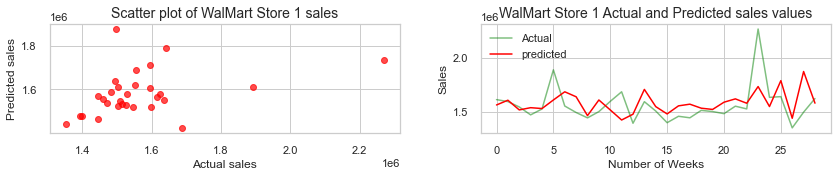

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 2 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 2 is  0.16
 
 


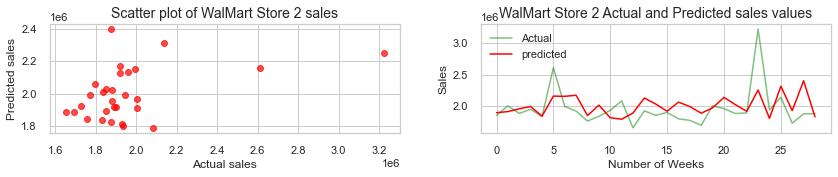

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 3 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 3 is  -0.03
 
 


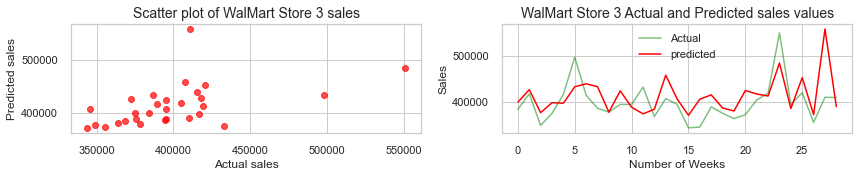

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 4 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 4 is  0.29
 
 


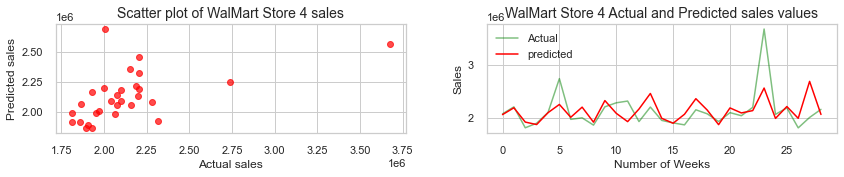

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 5 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 5 is  -0.14
 
 


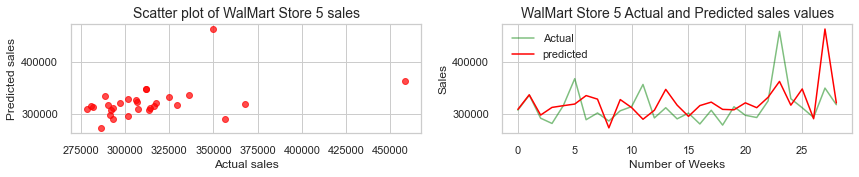

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 6 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 6 is  0.05
 
 


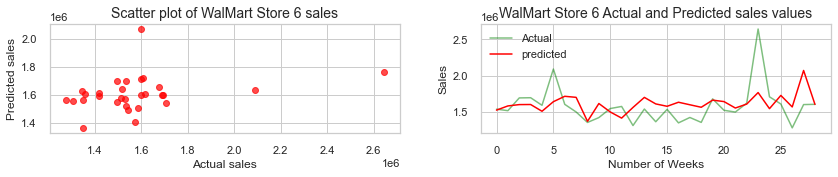

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 7 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 7 is  0.2
 
 


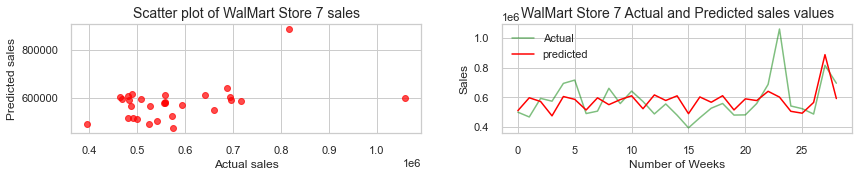

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 8 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 8 is  0.12
 
 


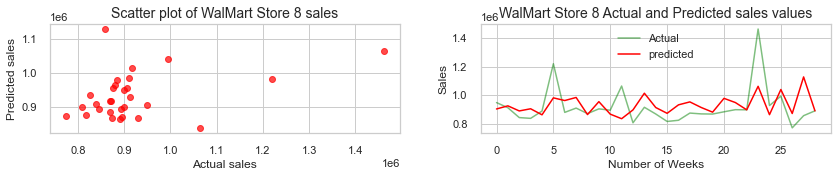

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 9 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 9 is  0.17
 
 


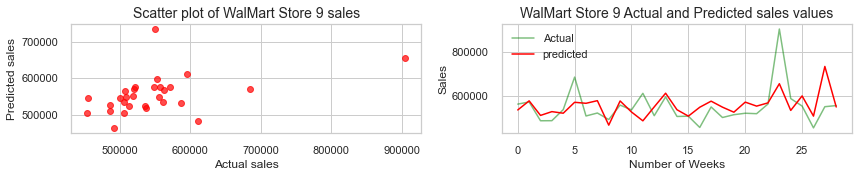

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 10 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 10 is  0.29
 
 


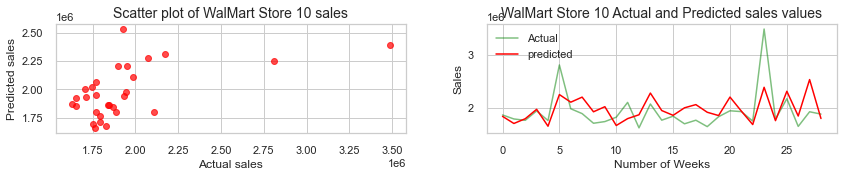

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 11 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 11 is  0.17
 
 


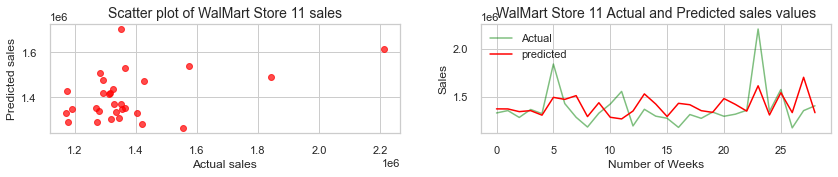

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 12 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 12 is  0.25
 
 


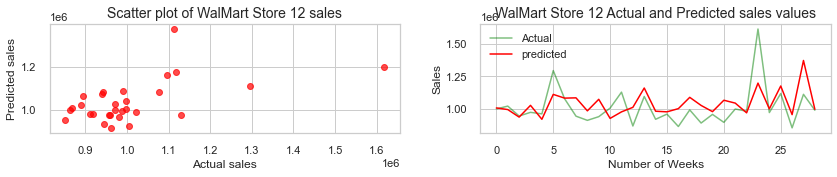

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 13 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 13 is  0.27
 
 


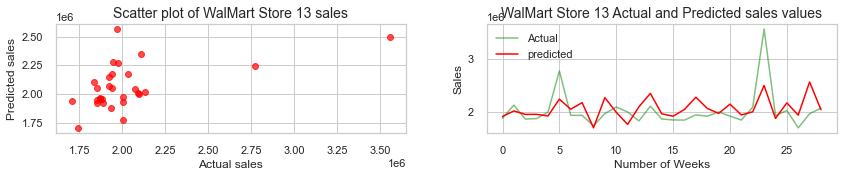

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 14 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 14 is  0.16
 
 


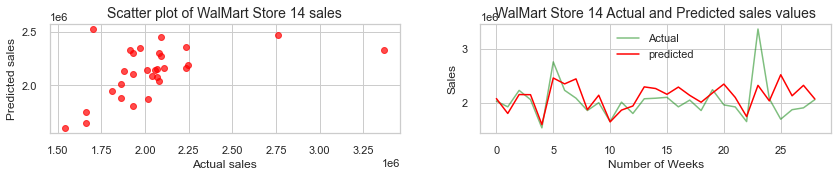

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 15 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 15 is  -0.0
 
 


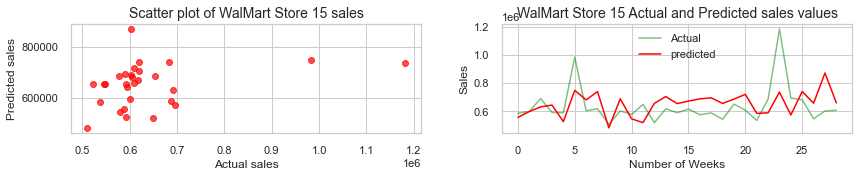

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 16 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 16 is  0.08
 
 


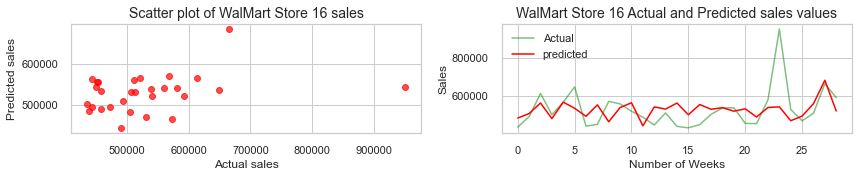

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 17 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 17 is  -0.35
 
 


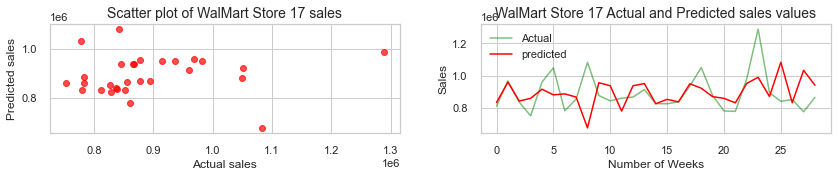

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 18 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 18 is  0.1
 
 


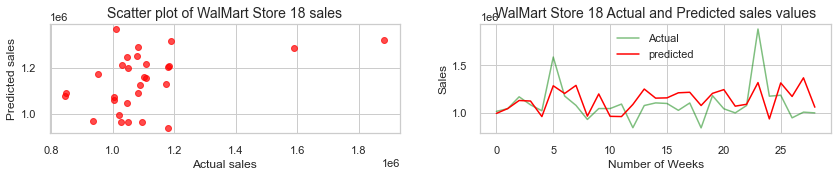

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 19 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 19 is  0.1
 
 


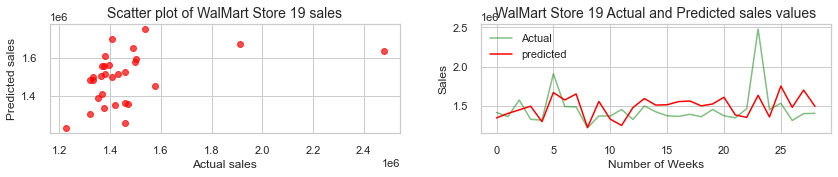

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 20 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 20 is  0.19
 
 


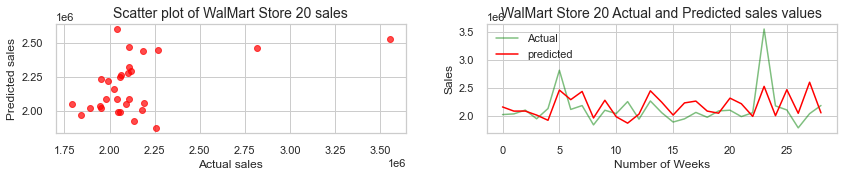

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 21 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 21 is  0.09
 
 


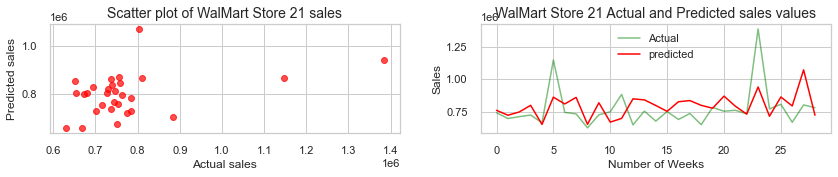

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 22 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 22 is  0.18
 
 


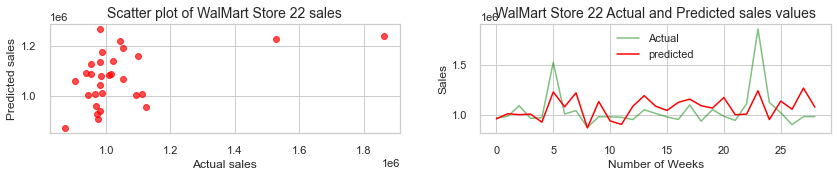

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 23 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 23 is  0.09
 
 


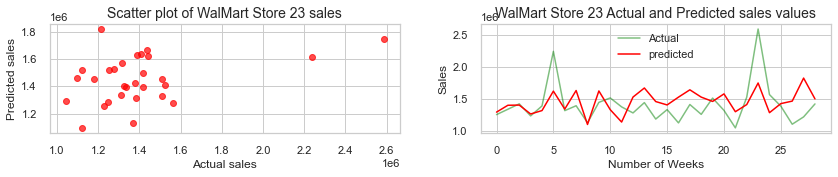

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 24 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 24 is  0.02
 
 


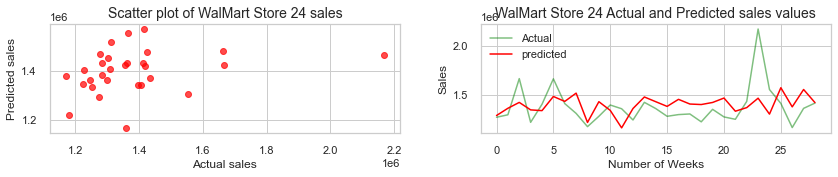

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 25 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 25 is  0.13
 
 


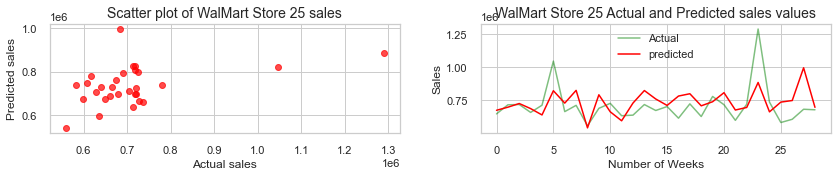

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 26 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 26 is  0.02
 
 


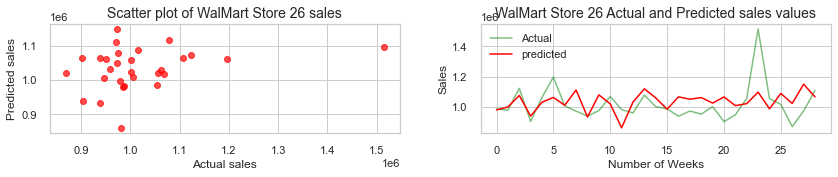

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 27 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 27 is  -0.12
 
 


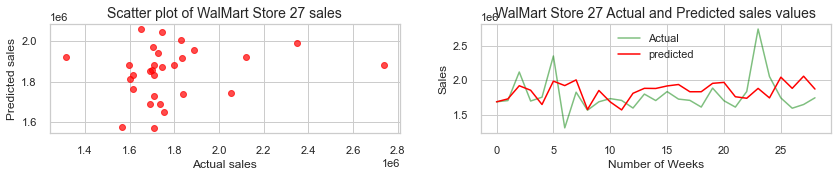

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 28 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 28 is  0.32
 
 


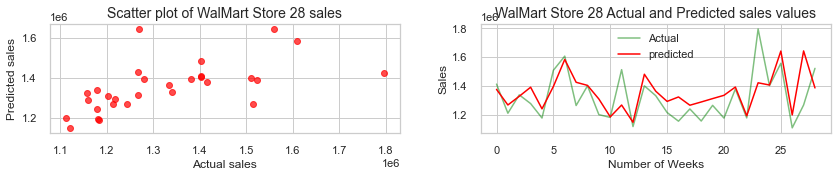

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 29 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 29 is  0.08
 
 


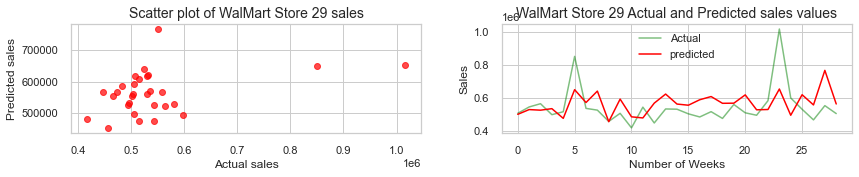

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 30 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 30 is  0.41
 
 


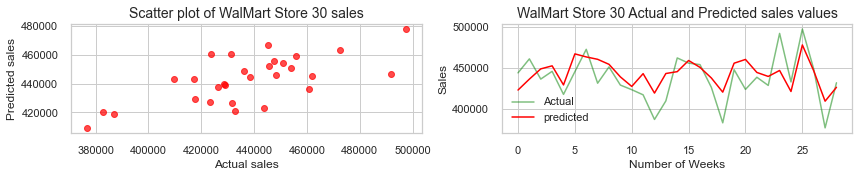

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 31 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 31 is  0.07
 
 


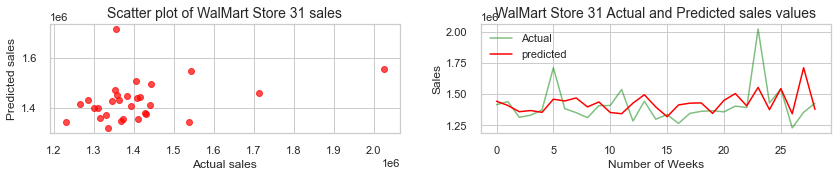

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 32 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 32 is  0.15
 
 


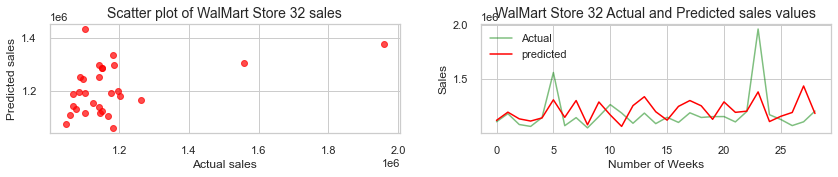

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 33 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 33 is  0.25
 
 


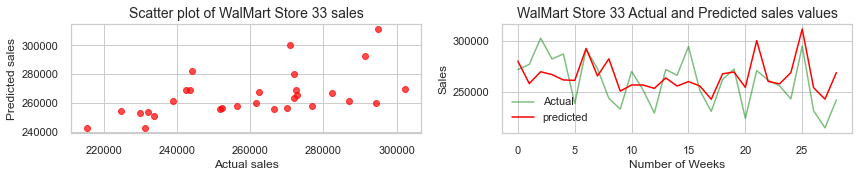

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 34 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 34 is  0.16
 
 


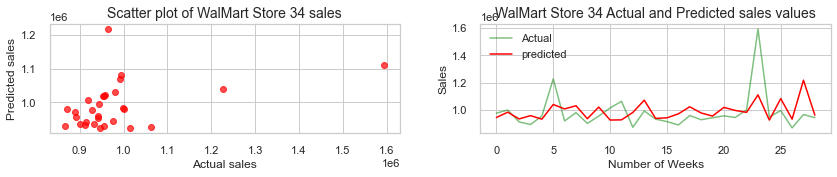

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 35 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 35 is  0.17
 
 


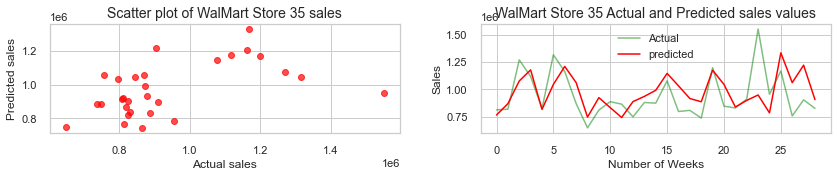

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 36 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 36 is  0.85
 
 


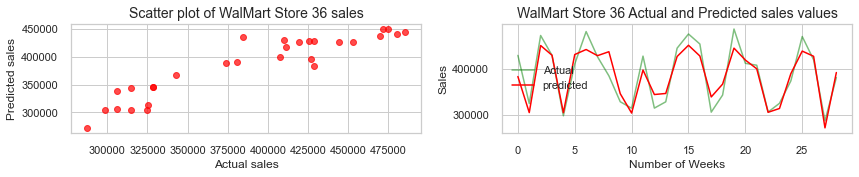

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 37 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 37 is  0.16
 
 


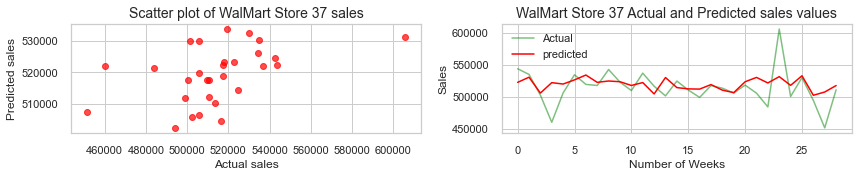

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 38 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 38 is  0.65
 
 


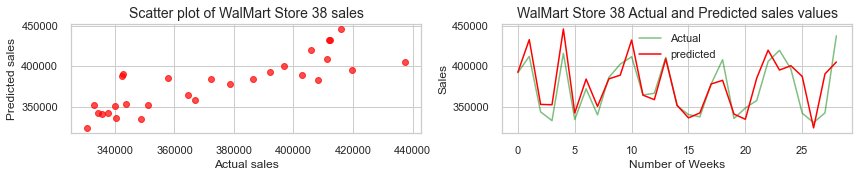

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 39 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 39 is  0.18
 
 


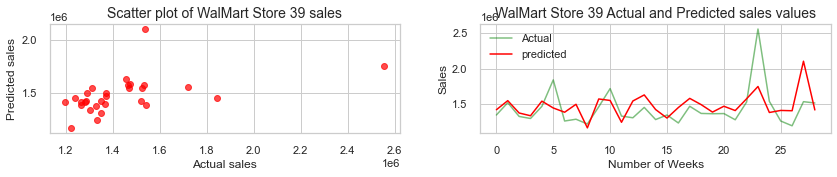

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 40 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 40 is  0.12
 
 


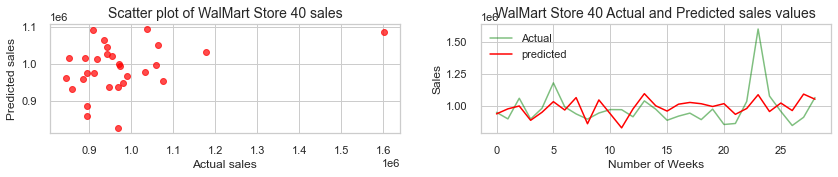

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 41 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 41 is  0.18
 
 


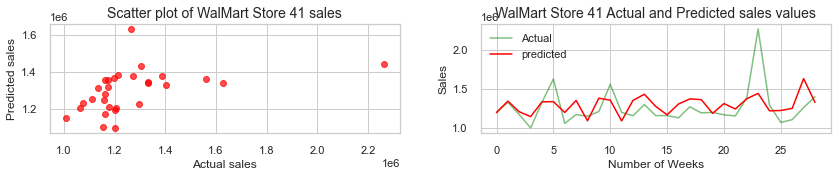

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 42 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 42 is  0.55
 
 


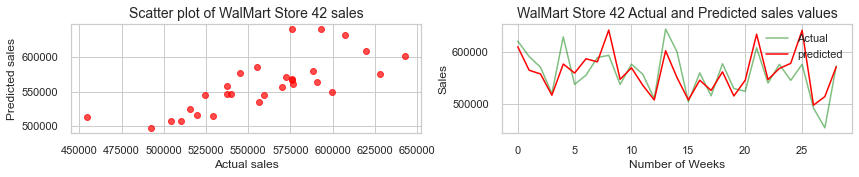

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 43 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 43 is  0.45
 
 


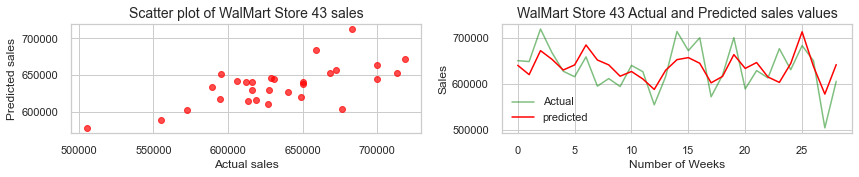

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 44 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 44 is  0.57
 
 


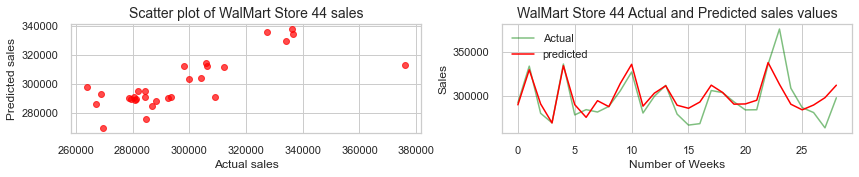

## <span style="color:red"> </span>

## <span style="color:red">Walmart Store 45 :</span>

## <span style="color:red"> </span>

R Squared Value for Walmart store 45 is  0.17
 
 


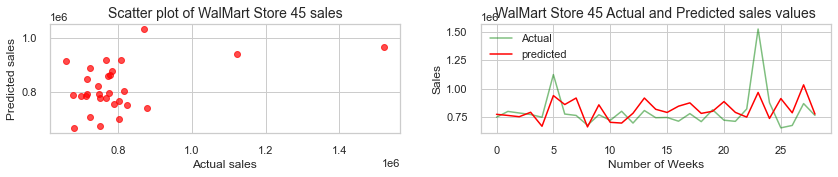

In [144]:
for i in range(1,46):
    def printmd(string):
        display(Markdown('## <span style="color:red">'+string+'</span>'))
    
    printmd(' ')
    printmd('Walmart Store '+str(i)+' :')
    printmd(' ')
    WData_ST1 = WData[WData['Store'] == i]
    WData_ST1.Date = WData_ST1['Date'].dt.date
    WData_ST1['Days'] = WData_ST1.apply(lambda row: days_calculator(row), axis=1)
    x = WData_ST1[['Holiday_Flag','Temperature','Fuel_Price','CPI','Unemployment','Holiday_Events','Year','Month','Semester','Days']]
    y = WData_ST1.iloc[:,2]
    Wxtrain,Wxtest,Wytrain,Wytest=train_test_split(x,y,test_size=0.2,random_state=1)
    scalar = StandardScaler()
    Wxtrain_scaled = scalar.fit_transform(Wxtrain)
    Wxtest_scaled = scalar.transform(Wxtest)
    Lreg = LinearRegression(normalize=False,copy_X=True,fit_intercept=True, n_jobs=-1)
    Lreg.fit(Wxtrain_scaled,Wytrain)
    Wypred = Lreg.predict(Wxtest_scaled)
    R2Squared = r2_score(Wytest,Wypred)
    plt.figure(figsize=(14,2))
    print('R Squared Value for Walmart store '+str(i)+' is ', np.round(R2Squared,2))
    print(' ')
    print(' ')
    plt.subplots_adjust(wspace=.23)
    
    plt.subplot(1,2,1)
    
    plt.scatter(Wytest,Wypred,c='red',alpha=.7)
    plt.xlabel('Actual sales')
    plt.ylabel('Predicted sales')
    plt.title('Scatter plot of WalMart Store '+ str(i)+ ' sales',fontsize=14)
    
    #
    #
    plt.subplot(1,2,2)
    ax = range(len(Wytest))
    plt.plot(ax, Wytest, label="Actual",alpha=.5,color='green')
    plt.plot(ax, Wypred, label="predicted",color='red')
    plt.title('WalMart Store '+ str(i)+ ' Actual and Predicted sales values',fontsize=14)
    plt.xlabel('Number of Weeks')
    plt.ylabel('Sales')
    plt.legend()
    plt.show()